# Lecture 6: From Unstructured Text to Structured Data - Part I
### [The Art of Analyzing Big Data - The Data Scientist’s Toolbox](https://www.ise.bgu.ac.il/labs/fire/lectures.html)

### by [Dr. Michael Fire](http://data4goodlab.github.io/MichaelFire/)
---


## 0. Package Setup
For this lecture, we are going to use the [Kaggle](https://github.com/Kaggle/kaggle-api), [Gensim](https://radimrehurek.com/gensim/), [pyLDAvis](https://github.com/bmabey/pyLDAvis/blob/master/README.rst), [spacy](https://spacy.io), and [Afinn](https://github.com/fnielsen/afinn) packages. Let's set them up:

In [ ]:
!pip install kaggle
!pip install gensim
!pip install bertopic
#!pip install pyLDAvis
!pip install spaCy
#!pip install afinn
!pip install vaex

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 120.7/120.7 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 8.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 56.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 8.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 91.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 65.1 MB/s eta 0:00:00
     ━━━

In [ ]:
#setting up Kaggle & TuriCreate package s
import json
import os

!mkdir /root/.kaggle/
# Installing the Kaggle package

#Important Note: complete this with your own key - after running this for the first time remmember to **remove** your API_KEY
api_token = {"username":"<Insert Your Kaggle User Name>","key":"<Insert Your Kaggle API key>"}

# creating kaggle.json file with the personal API-Key details
# You can also put this file on your Google Drive

with open('/root/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json

We also going to  use [The Blog Authorship Corpus](http://u.cs.biu.ac.il/~koppel/BlogCorpus.htm) from [Lecture 5 -  Notebook](https://colab.research.google.com/drive/1a37gzN4eAGCVhAooTawAbwuUW13Vxqlc). Let's download it this time from [Kaggle](https://www.kaggle.com/rtatman/blog-authorship-corpus):

In [ ]:
!mkdir ./datasets
!mkdir ./datasets/BIU-Blog-Authorship

# download the dataset from Kaggle and unzip it
!kaggle datasets download rtatman/blog-authorship-corpus -p ./datasets/BIU-Blog-Authorship
!unzip ./datasets/BIU-Blog-Authorship/*.zip  -d ./datasets/BIU-Blog-Authorship/


 99% 288M/290M [00:11<00:00, 31.5MB/s]
100% 290M/290M [00:11<00:00, 27.5MB/s]
Archive:  ./datasets/BIU-Blog-Authorship/blog-authorship-corpus.zip
  inflating: ./datasets/BIU-Blog-Authorship/blogtext.csv  


## 1. Bag-of-Words

Creating a document's bag-of-words is relatively simple using the [Python NLTK package](https://www.nltk.org/).
Let's use [The Blog Authorship Corpus](http://u.cs.biu.ac.il/~koppel/BlogCorpus.htm)

(see [Lecture 5 -  Notebook](https://colab.research.google.com/drive/1a37gzN4eAGCVhAooTawAbwuUW13Vxqlc)).
Let's use NLTK and create s a bag-of-words of a blog post:

In [ ]:
import nltk
from nltk.tokenize import word_tokenize
import pandas as pd
import vaex
nltk.download('punkt') # need to download punkt package from NLTK
DATA_SETS_PATH = "./datasets/BIU-Blog-Authorship"
#getting a blog post
#df = pd.read_csv(f"{DATA_SETS_PATH}/blogtext.csv")
v_df = vaex.read_csv(f"{DATA_SETS_PATH}/blogtext.csv", convert=True)
v_df

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


#,id,gender,age,topic,sign,date,text
0,2059027,male,15,Student,Leo,"14,May,2004","' Info has been found (+/- 100 pages, ..."
1,2059027,male,15,Student,Leo,"13,May,2004",' These are the team members: Drewes...
2,2059027,male,15,Student,Leo,"12,May,2004",' In het kader van kernfusie op aarde:...
3,2059027,male,15,Student,Leo,"12,May,2004",testing!!! testing!!!
4,3581210,male,33,InvestmentBanking,Aquarius,"11,June,2004",""" Thanks to Yahoo!'s Toolbar I can n..."
...,...,...,...,...,...,...,...
"681,279",1713845,male,23,Student,Taurus,"01,July,2004","' Dear Susan, I could write some really b..."
"681,280",1713845,male,23,Student,Taurus,"01,July,2004",""" Dear Susan, 'I have the second yeast in..."
"681,281",1713845,male,23,Student,Taurus,"01,July,2004",""" Dear Susan, Your 'boyfriend' is fucking..."
"681,282",1713845,male,23,Student,Taurus,"01,July,2004","' Dear Susan: Just to clarify, I am ask..."


In [ ]:
v_df.text

Expression = text
Length: 681,284 dtype: string (column)
--------------------------------------
     0  '           Info has been found (+/- 100 pages, ...
     1  '           These are the team members:   Drewes...
     2  '           In het kader van kernfusie op aarde:...
     3                               testing!!!  testing!!!
     4  "             Thanks to Yahoo!'s Toolbar I can n...
                            ...                            
681279  '       Dear Susan,  I could write some really b...
681280  "       Dear Susan,  'I have the second yeast in...
681281  "       Dear Susan,  Your 'boyfriend' is fucking...
681282  '       Dear Susan:    Just to clarify, I am ask...
681283  '       Hey everybody...and Susan,  You might al...

Now, we will turn the string to lowercase, split the text into words, and count the number of time each word appears:

In [ ]:
from collections import Counter
import re

blog_post = str(v_df.text.values[100])
blog_post = blog_post.lower()
words_list = word_tokenize(blog_post) # we can also tokenize the text using other methods
words_list

['i',
 'ca',
 "n't",
 'wait',
 'for',
 'things',
 'to',
 'get',
 'moving',
 ',',
 'i',
 'want',
 'out',
 'of',
 'here',
 '.',
 'im',
 'lookin',
 'forward',
 'to',
 'uni',
 'although',
 'it',
 'means',
 'another',
 '3',
 'years',
 'in',
 'england',
 '.',
 'it',
 'should',
 'be',
 'so',
 'much',
 'fun',
 'from',
 'my',
 'experiences',
 'of',
 'it',
 'so',
 'far',
 'and',
 'my',
 'brother',
 "'s",
 'experiences',
 '.',
 'after',
 'uni',
 'though',
 'it',
 'will',
 'be',
 'another',
 'year',
 'i',
 'guess',
 'before',
 'i',
 'can',
 'move',
 ',',
 'as',
 'i',
 "'ll",
 'need',
 'to',
 'work',
 'for',
 "'bout",
 'that',
 'long',
 'to',
 'get',
 'some',
 'money',
 '.',
 'will',
 'be',
 'quite',
 'lonely',
 'i',
 'imagine',
 'as',
 'every1',
 'will',
 'have',
 'moved',
 'on',
 'by',
 'then',
 '.',
 'i',
 'wana',
 'work',
 'in',
 'a',
 'pub',
 ',',
 'duno',
 'why',
 ',',
 'not',
 'any',
 'pub',
 ',',
 'not',
 'a',
 'big',
 'pub',
 ',',
 'i',
 "'d",
 'love',
 'to',
 'work',
 'the',
 'fox',
 'n',

In [ ]:
c = Counter(words_list)
c.most_common(10)

[('i', 33),
 (',', 21),
 ('to', 17),
 ('.', 16),
 ('it', 15),
 ('a', 13),
 ('the', 11),
 ('for', 10),
 ('that', 10),
 ('im', 9)]

We get a Bag-of-Words of the post. However, as can be seen, many of the most common words are words like "i," "to," and "the," i.e., [stopwords](https://en.wikipedia.org/wiki/Stop_words). In many cases, it may be better to remove the stopwords from our model (but not always). Let's remove the stopwords:

In [ ]:
nltk.download('stopwords')
from nltk.corpus import stopwords

stop_words_set = set(stopwords.words("english"))
words_list = [w for w in words_list if w not in stop_words_set]
c = Counter(words_list)
c.most_common(10)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


[(',', 21),
 ('.', 16),
 ('im', 9),
 ("'s", 9),
 ('n', 8),
 ('wana', 7),
 ('...', 5),
 ('work', 4),
 ('-', 4),
 (':', 4)]

We can also remove punctuation marks (although they can be useful):

In [ ]:
import re
re_words = re.compile(r"(\w+)")
l = re_words.findall(blog_post)
l = [w for w in l if w not in stop_words_set]
c = Counter(l)
c.most_common(10)

[('im', 9),
 ('n', 8),
 ('wana', 7),
 ('work', 4),
 ('gona', 4),
 ('fun', 3),
 ('year', 3),
 ('pub', 3),
 ('love', 3),
 ('hav', 3)]

In [ ]:
with vaex.progress.tree('rich', title="My Vaex computations"):
  v_df_grouped = v_df.groupby(['id', 'gender', 'topic', 'sign']).agg({
    'text_list': vaex.agg.list('text')})
  v_df_grouped.materialize()

Output()

In [ ]:
v_df_grouped

#,id,gender,topic,sign,text_list
0,3835942,male,indUnk,Taurus,"'["" Last weekend was a memorable one f..."
1,3305309,male,indUnk,Scorpio,"""[' It’s 11:15 in the morning, and my ..."
2,4192943,male,Sports-Recreation,Taurus,"'[\' \', "" Sexual nightma..."
3,3681917,male,Student,Leo,"'["" I am preparing for my wonderful trip t..."
4,3361107,male,Science,Virgo,"'[\' I AM 28% ASSHOLE/BITCH! \', "" ..."
...,...,...,...,...,...
"19,315",3403416,male,Banking,Gemini,"'["" Look, The next time I hear some talki..."
"19,316",3869610,female,Student,Scorpio,"'["" alright, so i just realiz..."
"19,317",3537022,male,Communications-Media,Libra,"'["" So consider yourself lucky. Two e..."
"19,318",3520152,male,Student,Scorpio,"""[' urlLink Make Love, Not War&nbsp; u..."


Let's clean the grouped DataFrame and remove bloggers that posted less than 10 times:

In [ ]:
v_df_grouped = v_df_grouped[v_df_grouped.text_list.apply(lambda l: len(l) >100)]
v_df_grouped.materialize()
v_df_grouped

#,id,gender,topic,sign,text_list
0,2283987,female,Communications-Media,Capricorn,"""[' It always makes me sad to see a colleg..."
1,4161674,male,Student,Taurus,"'["" T-- and I had the pleasure of sp..."
2,2213057,female,Student,Virgo,"'[\' \', "" ..."
3,426718,female,Non-Profit,Gemini,"'["" ITS CHRISTMAS!!!!!!!!!!!!!!!!! Y..."
4,3839744,female,indUnk,Sagittarius,"'["" Toledo Blade Rose Russell TERES..."
...,...,...,...,...,...
"1,350",1436059,female,Education,Gemini,"'["" I was so bored today, that I act..."
"1,351",728365,female,indUnk,Virgo,"'["" I\'ve had a very momentus week. I..."
"1,352",731614,male,Technology,Taurus,"""[' urlLink self portrait is now posted...."
"1,353",4255604,male,Student,Leo,"'["" For the first time, I think Exun h..."


In [ ]:
df = v_df_grouped.to_pandas_df()
df

,id,gender,topic,sign,text_list
0,2283987,female,Communications-Media,Capricorn,[ It always makes me sad to see a colleg...
1,4161674,male,Student,Taurus,[ T-- and I had the pleasure of sp...
2,2213057,female,Student,Virgo,"[ , ..."
3,426718,female,Non-Profit,Gemini,[ ITS CHRISTMAS!!!!!!!!!!!!!!!!! Y...
4,3839744,female,indUnk,Sagittarius,[ Toledo Blade Rose Russell TERES...
...,...,...,...,...,...
1350,1436059,female,Education,Gemini,"[ I was so bored today, that I act..."
1351,728365,female,indUnk,Virgo,[ I've had a very momentus week. I...
1352,731614,male,Technology,Taurus,[ urlLink self portrait is now posted....
1353,4255604,male,Student,Leo,"[ For the first time, I think Exun h..."


In [ ]:
df['text'] = df['text_list'].apply(lambda l: " ".join([str(p) for p in l]))
df = df.drop('text_list', axis=1)
df

,id,gender,topic,sign,text
0,2283987,female,Communications-Media,Capricorn,It always makes me sad to see a college...
1,4161674,male,Student,Taurus,T-- and I had the pleasure of spe...
2,2213057,female,Student,Virgo,...
3,426718,female,Non-Profit,Gemini,ITS CHRISTMAS!!!!!!!!!!!!!!!!! YE...
4,3839744,female,indUnk,Sagittarius,Toledo Blade Rose Russell TERESA...
...,...,...,...,...,...
1350,1436059,female,Education,Gemini,"I was so bored today, that I actu..."
1351,728365,female,indUnk,Virgo,I've had a very momentus week. I ...
1352,731614,male,Technology,Taurus,urlLink self portrait is now posted. ...
1353,4255604,male,Student,Leo,"For the first time, I think Exun ha..."


Let's create a new column with a bag-of-words of each blog:

In [ ]:
from collections import Counter
from tqdm import tqdm
#We can use apply however (or vaex.apply). However, to get time estimation, we will use iterrows
#df['words_dict'] = df.text.apply(lambda t: dict(Counter(word_tokenize(t))))

def text2commonwords(t, words_num=1000):
  return dict(Counter(word_tokenize(t)).most_common(words_num))

l = [text2commonwords(t) for t in tqdm(df['text'].values)]
df['words_counter'] = l

100%|██████████| 1355/1355 [09:21<00:00,  2.41it/s]


In [ ]:
df

,id,gender,topic,sign,text,words_counter
0,3236721,male,Science,Pisces,FPGA RSAC MrSID MAC (not the computer) ...,"{'.': 758, ',': 667, 'the': 652, 'to': 400, 'a..."
1,3801445,male,Education,Taurus,urlLink Koreans have an obses...,"{'urlLink': 198, 'the': 111, '&': 100, 'nbsp':..."
2,2539742,female,indUnk,Libra,counting the hours..still putting my an...,"{'..': 1506, 'to': 1015, 'i': 1007, '.': 997, ..."
3,3506939,female,indUnk,Cancer,"Lord, are you here? I know yo...","{'.': 3882, 'I': 3610, ',': 2950, 'to': 2716, ..."
4,479019,male,Student,Gemini,For an explanation on posts from ...,"{'.': 8833, 'I': 7365, 'the': 4530, ',': 4307,..."
...,...,...,...,...,...,...
1350,2238828,female,indUnk,Libra,if i say my heart is sore / ...,"{',': 5723, '.': 3868, 'the': 3339, 'and': 272..."
1351,3885865,male,Environment,Scorpio,"A Poem, A Query, A Charge I wonder...","{'.': 1372, ',': 1061, 'the': 974, 'to': 690, ..."
1352,470861,male,indUnk,Cancer,Okay back. Rita and I just w...,"{'.': 31334, 'I': 22437, ',': 14106, 'to': 137..."
1353,216413,female,Law,Cancer,"No gym for a week, silly me. Was lazy a...","{',': 18209, '.': 15698, 'the': 10089, 'and': ..."


In [ ]:
df.to_parquet("./blog_authors_counter.parquet") # Save in case something will going to crash in the future
!ls -lh ./blog_authors_counter.parquet

-rw-r--r-- 1 root root 241M Apr 24 05:53 ./blog_authors_counter.parquet


We can use these vectors to predict various bloggers' properties:

In [ ]:
from sklearn.feature_extraction import DictVectorizer
vec = DictVectorizer()
X = vec.fit_transform(df['words_counter'].values)
X.toarray()

array([[1.010e+02, 0.000e+00, 5.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [3.600e+01, 1.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [8.390e+02, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       ...,
       [4.143e+03, 0.000e+00, 1.740e+02, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [4.770e+02, 3.600e+01, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [9.700e+01, 7.000e+00, 6.600e+01, ..., 0.000e+00, 0.000e+00,
        0.000e+00]])

In [ ]:
X.shape

(1355, 62689)

In [ ]:
 features_df = pd.DataFrame.sparse.from_spmatrix(X, columns=vec.get_feature_names_out())
 features_df['gender'] = df['gender'].apply(lambda gender: 1 if gender.lower() == "male" else 0)
 features_df

,!,#,$,%,&,','','-,'-bish,'-josh,...,�Rah,��,���,����,�����,������,�������,��������,���������,����������
0,101.0,0.0,5.0,3.0,75.0,58.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,36.0,1.0,0.0,0.0,100.0,8.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,839.0,0.0,0.0,4.0,73.0,135.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,138.0,0.0,0.0,8.0,313.0,29.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,610.0,0.0,59.0,102.0,31.0,509.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1350,108.0,0.0,0.0,0.0,17.0,204.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1351,155.0,0.0,0.0,0.0,70.0,143.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1352,4143.0,0.0,174.0,0.0,241.0,1494.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1353,477.0,36.0,0.0,0.0,302.0,1331.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score

train, test = train_test_split(features_df, test_size=0.2)
X_train, X_test = train.drop('gender', axis=1), test.drop('gender', axis=1)
y_train, y_test = train['gender'], test['gender']


# Train a model using the scikit-learn API
clf = RandomForestClassifier(max_depth=4, random_state=0, n_estimators=500, n_jobs=-1 )
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)
print(accuracy_score(y_test,y_predict), roc_auc_score(y_test,y_predict))

0.7121771217712177 0.7116139585605235


We get a classifier with AUC of 0.711, and we can also create a classifier that predict the blog's
topic:

In [ ]:
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()
encoder.fit(df[['topic']])
features_df['topic'] = encoder.transform(df[['topic']])


In [ ]:
from sklearn.preprocessing import OrdinalEncoder
features_df = features_df.drop('gender', axis=1)

encoder = OrdinalEncoder()
encoder.fit(df[['topic']])
features_df['topic'] = encoder.transform(df[['topic']])



In [ ]:
features_df['topic']

0       31.0
1       13.0
2       38.0
3       38.0
4       33.0
        ... 
1350    38.0
1351    15.0
1352    38.0
1353    21.0
1354    14.0
Name: topic, Length: 1355, dtype: float64

In [ ]:
train, test = train_test_split(features_df, test_size=0.2, random_state=42)
X_train, X_test = train.drop('topic', axis=1), test.drop('topic', axis=1)
y_train, y_test = train['topic'], test['topic']


# Train a model using the scikit-learn API
clf = RandomForestClassifier(max_depth=7, random_state=0, n_estimators=1000, n_jobs=-1 )
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)
print(accuracy_score(y_test,y_predict))

0.36531365313653136


In [ ]:
from sklearn.dummy import DummyClassifier

dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X_train, y_train)
y_predict = dummy_clf.predict(X_test)
print(accuracy_score(y_test,y_predict))

0.3505535055350554


By transferring blogs into their bag-of-words representation, we created a classifier which can predict the topic of a blog out of 40 topics with accuracy of about 0.365 (not a lot better than simple classification).

## 2. N-Grams

Similar to calculating a bag-of-words, we can calculate  various n-grams from the blog posts and utilize them to predict
various blog properties. Let's calculate each blogs 2-grams and 3-grams both using TuriCreate's [count_ngrams](https://apple.github.io/turicreate/docs/api/generated/turicreate.text_analytics.count_ngrams.html#turicreate-text-analytics-count-ngrams) function:

In [ ]:
import nltk
from nltk.tokenize import word_tokenize
import pandas as pd
import vaex
nltk.download('punkt') # need to download punkt package from NLTK
DATA_SETS_PATH = "./datasets/BIU-Blog-Authorship"
#getting a blog post
#df = pd.read_csv(f"{DATA_SETS_PATH}/blogtext.csv")
v_df = vaex.read_csv(f"{DATA_SETS_PATH}/blogtext.csv", convert=True)

with vaex.progress.tree('rich', title="My Vaex computations"):
  v_df_grouped = v_df.groupby(['id', 'gender', 'topic', 'sign']).agg({
    'text_list': vaex.agg.list('text')})
  v_df_grouped.materialize()
v_df_grouped = v_df_grouped[v_df_grouped.text_list.apply(lambda l: len(l) >100)]
v_df_grouped.materialize()
v_df_grouped

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


Output()

#,id,gender,topic,sign,text_list
0,3695814,male,Chemicals,Leo,"""[' This is one for me and my friends. ..."
1,3179193,female,Student,Cancer,"'["" Yesterday was okay. I didn\'t blog. \'Co..."
2,1245629,male,Technology,Gemini,"'["" One well known guy has this to say abo..."
3,2134421,male,indUnk,Sagittarius,"'["" YOU KNOW CHARLES MURRAY\'S NE..."
4,2874412,female,Telecommunications,Aries,"'["" ...Welcome! ...Basicully everyone..."
...,...,...,...,...,...
"1,350",2173787,female,Student,Capricorn,"""[' So, I have gone and done it. I seem t..."
"1,351",2602604,female,indUnk,Leo,"""[' first of all id like to say ..."
"1,352",2441206,male,indUnk,Taurus,"'[\' Happy New Year everybody! \', ""..."
"1,353",867772,female,Student,Taurus,"'["" I know this is going to make..."


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
df = v_df_grouped.to_pandas_df()
df['text'] = df['text_list'].apply(lambda l: " ".join(l))
df = df.drop('text_list', axis=1)
df

,id,gender,topic,sign,text
0,3236721,male,Science,Pisces,FPGA RSAC MrSID MAC (not the computer) ...
1,3801445,male,Education,Taurus,urlLink Koreans have an obses...
2,2539742,female,indUnk,Libra,counting the hours..still putting my an...
3,3506939,female,indUnk,Cancer,"Lord, are you here? I know yo..."
4,479019,male,Student,Gemini,For an explanation on posts from ...
...,...,...,...,...,...
1350,2238828,female,indUnk,Libra,if i say my heart is sore / ...
1351,3885865,male,Environment,Scorpio,"A Poem, A Query, A Charge I wonder..."
1352,470861,male,indUnk,Cancer,Okay back. Rita and I just w...
1353,216413,female,Law,Cancer,"No gym for a week, silly me. Was lazy a..."


In [ ]:
# see also https://practicaldatascience.co.uk/machine-learning/how-to-use-count-vectorization-for-n-gram-analysis
model = CountVectorizer(ngram_range = (2, 2), max_features = 2000, stop_words='english')
X = model.fit_transform(df.text).toarray()
X

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 1, 1, 0],
       [0, 0, 0, ..., 6, 2, 0],
       [0, 0, 0, ..., 0, 2, 0]])

In [ ]:
model.get_feature_names_out()

array(['00 pm', '000 people', '003399 fcolor', ..., 'young man',
       'young people', 'youth group'], dtype=object)

In [ ]:
df_output = pd.DataFrame(data = X, columns = model.get_feature_names_out())
df_output['gender'] = df['gender'].apply(lambda gender: 1 if gender.lower() == "male" else 0)
df_output

,00 pm,000 people,003399 fcolor,10 00,10 000,10 15,10 30,10 days,10 minutes,10 pm,...,yesterday afternoon,yesterday got,yesterday morning,yesterday went,york city,york times,young man,young people,youth group,gender
0,0,0,0,0,0,1,1,0,3,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,1,0,...,1,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,6,0,0,0,0,2,5,5,0,7,...,1,3,0,7,2,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1350,0,0,0,0,0,0,4,0,0,0,...,1,0,0,1,0,0,0,0,2,0
1351,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
1352,0,0,0,0,2,2,0,8,49,0,...,3,1,13,3,6,0,1,1,0,1
1353,0,0,0,0,0,2,2,3,9,0,...,12,0,6,1,1,0,6,2,0,0


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score

train, test = train_test_split(df_output, test_size=0.2)
X_train, X_test = train.drop('gender', axis=1), test.drop('gender', axis=1)
y_train, y_test = train['gender'], test['gender']


# Train a model using the scikit-learn API
clf = RandomForestClassifier(max_depth=4, random_state=0, n_estimators=500, n_jobs=-1 )
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)
print(accuracy_score(y_test,y_predict), roc_auc_score(y_test,y_predict))

0.6863468634686347 0.6871992563429572


We can use combinations of n-grams, and see if this improves the results:

In [ ]:
model = CountVectorizer(ngram_range = (2, 3), max_features = 2000, stop_words='english')
X = model.fit_transform(df.text).toarray()
X

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 1, 1, 0],
       [0, 0, 0, ..., 6, 2, 0],
       [0, 0, 0, ..., 0, 2, 0]])

In [ ]:
df_output = pd.DataFrame(data = X, columns = model.get_feature_names_out())
df_output['gender'] = df['gender'].apply(lambda gender: 1 if gender.lower() == "male" else 0)
df_output

,00 pm,000 people,003399 fcolor,003399 fcolor ffffff,10 00,10 000,10 15,10 30,10 days,10 minutes,...,yes yes,yesterday got,yesterday morning,yesterday went,york city,york times,young man,young people,youth group,gender
0,0,0,0,0,0,0,1,1,0,3,...,2,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,6,0,0,0,0,0,2,5,5,0,...,0,3,0,7,2,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1350,0,0,0,0,0,0,0,4,0,0,...,0,0,0,1,0,0,0,0,2,0
1351,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,1
1352,0,0,0,0,0,2,2,0,8,49,...,5,1,13,3,6,0,1,1,0,1
1353,0,0,0,0,0,0,2,2,3,9,...,4,0,6,1,1,0,6,2,0,0


In [ ]:
train, test = train_test_split(df_output, test_size=0.2)
X_train, X_test = train.drop('gender', axis=1), test.drop('gender', axis=1)
y_train, y_test = train['gender'], test['gender']


# Train a model using the scikit-learn API
clf = RandomForestClassifier(max_depth=4, random_state=0, n_estimators=500, n_jobs=-1 )
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)
print(accuracy_score(y_test,y_predict), roc_auc_score(y_test,y_predict))

0.7084870848708487 0.7073662416911844


In [ ]:
model = CountVectorizer(ngram_range = (1, 3), max_features = 5000, stop_words='english')
X = model.fit_transform(df.text).toarray()
df_output = pd.DataFrame(data = X, columns = model.get_feature_names_out())
df_output['gender'] = df['gender'].apply(lambda gender: 1 if gender.lower() == "male" else 0)
train, test = train_test_split(df_output, test_size=0.2)
X_train, X_test = train.drop('gender', axis=1), test.drop('gender', axis=1)
y_train, y_test = train['gender'], test['gender']


# Train a model using the scikit-learn API
clf = RandomForestClassifier(max_depth=4, random_state=0, n_estimators=500, n_jobs=-1 )
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)
print(accuracy_score(y_test,y_predict), roc_auc_score(y_test,y_predict))

0.7232472324723247 0.7236627083560301


## 3. TF-IDF

In [ ]:
#see also https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html
from sklearn.feature_extraction.text import TfidfVectorizer
corpus = ['I like big dogs', 'I like big cats', 'I like tigers']
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(corpus).toarray()
pd.DataFrame(data = X, columns = vectorizer.get_feature_names_out())


,big,cats,dogs,like,tigers
0,0.547832,0.000000,0.720333,0.425441,0.000000
1,0.547832,0.720333,0.000000,0.425441,0.000000
2,0.000000,0.000000,0.000000,0.508542,0.861037


In [ ]:
df

,id,gender,topic,sign,text
0,2283987,female,Communications-Media,Capricorn,It always makes me sad to see a college...
1,4161674,male,Student,Taurus,T-- and I had the pleasure of spe...
2,2213057,female,Student,Virgo,...
3,426718,female,Non-Profit,Gemini,ITS CHRISTMAS!!!!!!!!!!!!!!!!! YE...
4,3839744,female,indUnk,Sagittarius,Toledo Blade Rose Russell TERESA...
...,...,...,...,...,...
1350,1436059,female,Education,Gemini,"I was so bored today, that I actu..."
1351,728365,female,indUnk,Virgo,I've had a very momentus week. I ...
1352,731614,male,Technology,Taurus,urlLink self portrait is now posted. ...
1353,4255604,male,Student,Leo,"For the first time, I think Exun ha..."


In [ ]:
model = TfidfVectorizer(max_features = 1000, stop_words='english')
X = model.fit_transform(df.text).toarray()
X

array([[0.01228968, 0.00705582, 0.04668648, ..., 0.06511226, 0.        ,
        0.00572393],
       [0.00142011, 0.00570725, 0.01783269, ..., 0.00752392, 0.04383016,
        0.03935435],
       [0.01545085, 0.        , 0.01521728, ..., 0.08575864, 0.0026493 ,
        0.00629672],
       ...,
       [0.00427249, 0.00858532, 0.03313728, ..., 0.01293498, 0.00879106,
        0.01218825],
       [0.01475191, 0.        , 0.08354124, ..., 0.00372178, 0.        ,
        0.00400792],
       [0.00573396, 0.00288051, 0.00952978, ..., 0.02495435, 0.01179816,
        0.01051547]])

In [ ]:
model.get_feature_names_out()

array(['00', '000', '10', '100', '11', '12', '13', '14', '15', '16', '17',
       '18', '20', '2003', '2004', '24', '25', '30', '40', '45', '50',
       'able', 'absolutely', 'according', 'act', 'action', 'actually',
       'add', 'added', 'admit', 'afraid', 'afternoon', 'age', 'ago',
       'agree', 'ah', 'ahead', 'air', 'al', 'album', 'alright', 'amazing',
       'america', 'american', 'angry', 'annoying', 'answer', 'anymore',
       'anyways', 'apartment', 'apparently', 'area', 'aren', 'arms',
       'art', 'article', 'ask', 'asked', 'asking', 'asleep', 'ass', 'ate',
       'attention', 'away', 'awesome', 'baby', 'bad', 'bag', 'ball',
       'band', 'bar', 'based', 'basically', 'beach', 'beat', 'beautiful',
       'bed', 'beer', 'began', 'begin', 'beginning', 'believe', 'ben',
       'best', 'better', 'big', 'birthday', 'bit', 'bitch', 'black',
       'blah', 'blog', 'blogger', 'blogging', 'blogs', 'blood', 'blue',
       'board', 'body', 'book', 'books', 'bored', 'boring', 'born',


In [ ]:
df_output = pd.DataFrame(data = X, columns = model.get_feature_names_out())
df_output['gender'] = df['gender'].apply(lambda gender: 1 if gender.lower() == "male" else 0)
df_output

,00,000,10,100,11,12,13,14,15,16,...,yay,yea,yeah,year,years,yes,yesterday,york,young,gender
0,0.012290,0.007056,0.046686,0.011812,0.010821,0.028300,0.012272,0.018216,0.013576,0.013693,...,0.000000,0.000000,0.037534,0.074116,0.029565,0.035378,0.065112,0.000000,0.005724,0
1,0.001420,0.005707,0.017833,0.007166,0.005470,0.004360,0.013649,0.004911,0.005491,0.004922,...,0.000000,0.000000,0.008996,0.029975,0.084219,0.015898,0.007524,0.043830,0.039354,1
2,0.015451,0.000000,0.015217,0.002166,0.007936,0.011860,0.004500,0.011133,0.005974,0.004463,...,0.033963,0.132865,0.006117,0.018743,0.005656,0.080720,0.085759,0.002649,0.006297,0
3,0.000000,0.002945,0.017320,0.012325,0.006774,0.004500,0.005122,0.002534,0.009066,0.005080,...,0.000000,0.000000,0.083548,0.053333,0.021459,0.120313,0.008874,0.003015,0.011945,0
4,0.000000,0.014543,0.006682,0.002282,0.003485,0.007291,0.003952,0.003129,0.004197,0.007839,...,0.000000,0.000000,0.000716,0.042799,0.042059,0.004051,0.004108,0.031178,0.012166,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1350,0.004092,0.004111,0.017379,0.009463,0.026008,0.013348,0.008044,0.014152,0.014238,0.007978,...,0.057339,0.003199,0.100439,0.055097,0.033703,0.075584,0.026325,0.001052,0.009172,0
1351,0.000984,0.007913,0.021816,0.009107,0.007585,0.014358,0.006882,0.007661,0.013703,0.001706,...,0.000000,0.000000,0.017149,0.052308,0.024507,0.022777,0.029060,0.003038,0.010431,0
1352,0.004272,0.008585,0.033137,0.017965,0.018104,0.013118,0.013066,0.009235,0.011563,0.011107,...,0.007044,0.003340,0.040596,0.024878,0.023461,0.033481,0.012935,0.008791,0.012188,1
1353,0.014752,0.000000,0.083541,0.008271,0.011365,0.033970,0.008593,0.008503,0.034222,0.029828,...,0.000000,0.000000,0.003894,0.032211,0.014401,0.018350,0.003722,0.000000,0.004008,1


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score

train, test = train_test_split(df_output, test_size=0.2)
X_train, X_test = train.drop('gender', axis=1), test.drop('gender', axis=1)
y_train, y_test = train['gender'], test['gender']


# Train a model using the scikit-learn API
clf = RandomForestClassifier(max_depth=4, random_state=0, n_estimators=500, n_jobs=-1 )
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)
print(accuracy_score(y_test,y_predict), roc_auc_score(y_test,y_predict))

0.7970479704797048 0.7972602739726028


## 4. Topic Models

For using topic models, we will use the Kaggle's [NIPS dataset](https://www.kaggle.com/benhamner/nips-papers#papers.csv).
Let's download the dataset and load the papers into an SFrame object:

In [ ]:
!mkdir ./datasets/NIPS

# download the dataset from Kaggle and unzip it
!kaggle datasets download benhamner/nips-papers -f papers.csv -p ./datasets/NIPS/
!unzip ./datasets/NIPS/*.zip  -d ./datasets/NIPS/

mkdir: cannot create directory ‘./datasets/NIPS’: No such file or directory
 93% 65.0M/69.7M [00:01<00:00, 60.8MB/s]
100% 69.7M/69.7M [00:01<00:00, 61.9MB/s]
Archive:  ./datasets/NIPS/papers.csv.zip
  inflating: ./datasets/NIPS/papers.csv  


In [ ]:
import pandas as pd
df = pd.read_csv("./datasets/NIPS/papers.csv")
df

,id,year,title,event_type,pdf_name,abstract,paper_text
0,1,1987,Self-Organization of Associative Database and ...,NaN,1-self-organization-of-associative-database-an...,Abstract Missing,767\n\nSELF-ORGANIZATION OF ASSOCIATIVE DATABA...
1,10,1987,A Mean Field Theory of Layer IV of Visual Cort...,NaN,10-a-mean-field-theory-of-layer-iv-of-visual-c...,Abstract Missing,683\n\nA MEAN FIELD THEORY OF LAYER IV OF VISU...
2,100,1988,Storing Covariance by the Associative Long-Ter...,NaN,100-storing-covariance-by-the-associative-long...,Abstract Missing,394\n\nSTORING COVARIANCE BY THE ASSOCIATIVE\n...
3,1000,1994,Bayesian Query Construction for Neural Network...,NaN,1000-bayesian-query-construction-for-neural-ne...,Abstract Missing,Bayesian Query Construction for Neural\nNetwor...
4,1001,1994,"Neural Network Ensembles, Cross Validation, an...",NaN,1001-neural-network-ensembles-cross-validation...,Abstract Missing,"Neural Network Ensembles, Cross\nValidation, a..."
...,...,...,...,...,...,...,...
7236,994,1994,Single Transistor Learning Synapses,NaN,994-single-transistor-learning-synapses.pdf,Abstract Missing,Single Transistor Learning Synapses\n\nPaul Ha...
7237,996,1994,"Bias, Variance and the Combination of Least Sq...",NaN,996-bias-variance-and-the-combination-of-least...,Abstract Missing,"Bias, Variance and the Combination of\nLeast S..."
7238,997,1994,A Real Time Clustering CMOS Neural Engine,NaN,997-a-real-time-clustering-cmos-neural-engine.pdf,Abstract Missing,A Real Time Clustering CMOS\nNeural Engine\nT....
7239,998,1994,Learning direction in global motion: two class...,NaN,998-learning-direction-in-global-motion-two-cl...,Abstract Missing,Learning direction in global motion: two\nclas...


<ipython-input-5-91a784d6e545>:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['paper_length'])


<Axes: xlabel='paper_length', ylabel='Density'>

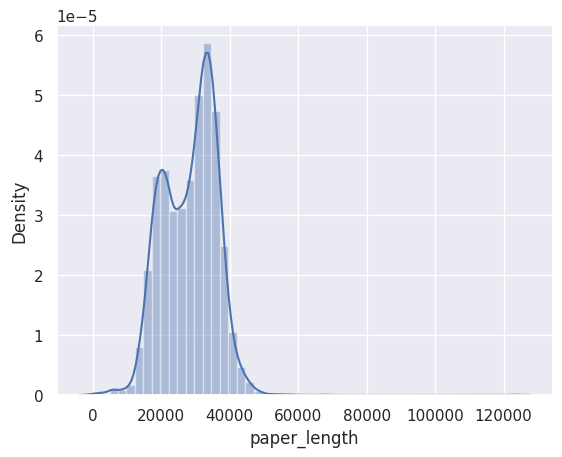

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set()
df['paper_length'] = df['paper_text'].apply(lambda t: len(t))
sns.distplot(df['paper_length'])

In [ ]:
df = df[(df['paper_length'] >20000) & (df['paper_length']<40000) ]
df.shape

(5656, 8)

Let's find the most common words that are notstop words:

In [ ]:
import nltk
nltk.download('stopwords')
import re
from collections import Counter
from nltk.corpus import stopwords


stop_words_set = set(stopwords.words("english"))

txt = "\n".join(df['paper_text'])
l = [w for w in re.findall(r"(\w+)", txt) if w not in stop_words_set]
d = Counter(l)
d.most_common(100)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


[('1', 481468),
 ('0', 285844),
 ('2', 277009),
 ('The', 168960),
 ('3', 133109),
 ('In', 120999),
 ('x', 120581),
 ('A', 114050),
 ('4', 109840),
 ('k', 108043),
 ('We', 107605),
 ('5', 97001),
 ('n', 89648),
 ('model', 82835),
 ('X', 80866),
 ('data', 75729),
 ('P', 72619),
 ('p', 70872),
 ('T', 70820),
 ('6', 70467),
 ('S', 67402),
 ('learning', 64672),
 ('M', 64505),
 ('set', 61693),
 ('algorithm', 60666),
 ('10', 60377),
 ('f', 57396),
 ('j', 56326),
 ('function', 55774),
 ('R', 55096),
 ('e', 54997),
 ('8', 53939),
 ('D', 52556),
 ('using', 50884),
 ('C', 49962),
 ('N', 49776),
 ('This', 49478),
 ('J', 49361),
 ('7', 49254),
 ('time', 46325),
 ('E', 46099),
 ('K', 45834),
 ('one', 45730),
 ('L', 45550),
 ('two', 44515),
 ('For', 43971),
 ('problem', 43575),
 ('b', 43527),
 ('number', 42926),
 ('B', 42455),
 ('9', 39807),
 ('distribution', 38790),
 ('Y', 38639),
 ('models', 38309),
 ('I', 38277),
 ('Figure', 37693),
 ('used', 37373),
 ('also', 37191),
 ('w', 36765),
 ('r', 36274),

We can see that numbers and one letter words also need to be removed. We see that plural versions of some words
are also common. Let's repeat the above process, but this time let's remove uncommon words.
We will also stem the words
using [NLTK Porter stemmer](http://www.nltk.org/howto/stem.html):

In [ ]:
from nltk.stem.porter import *
from functools import lru_cache

def skip_word(w):
    if len(w) < 2 or w in stop_words_set:
        return True
    return False
stemmer = PorterStemmer()

#Using cahcing for faster performence
@lru_cache(maxsize=None)
def word_stemming(w):
    return stemmer.stem(w)

l = [word_stemming(w) for w in re.findall(r"(\w+)", txt) if not skip_word(w) ]
d = Counter(l)
d.most_common(200)

[('the', 169359),
 ('use', 139614),
 ('model', 138679),
 ('in', 121886),
 ('learn', 108446),
 ('we', 107691),
 ('algorithm', 102876),
 ('set', 94115),
 ('function', 83420),
 ('data', 80280),
 ('comput', 66084),
 ('method', 63452),
 ('gener', 63433),
 ('problem', 62932),
 ('result', 61520),
 ('10', 60432),
 ('distribut', 59934),
 ('time', 58157),
 ('optim', 56816),
 ('estim', 55792),
 ('one', 55427),
 ('sampl', 55395),
 ('network', 52577),
 ('train', 52296),
 ('thi', 49534),
 ('number', 48053),
 ('two', 46478),
 ('valu', 46100),
 ('perform', 45159),
 ('for', 44101),
 ('bound', 43851),
 ('figur', 43089),
 ('paramet', 43053),
 ('imag', 42971),
 ('show', 42818),
 ('differ', 42718),
 ('featur', 42712),
 ('base', 41210),
 ('state', 40273),
 ('also', 39579),
 ('approxim', 38868),
 ('follow', 38750),
 ('given', 38666),
 ('point', 38307),
 ('matrix', 37804),
 ('process', 37389),
 ('case', 37162),
 ('log', 36852),
 ('inform', 36055),
 ('probabl', 35835),
 ('approach', 35379),
 ('exampl', 35316),

In [ ]:
from nltk.stem.porter import *
stemmer = PorterStemmer()
stemmer.stem("helping")



'help'

Based on the above results let's add to the stopwords words that appeared over 20,000 times:

In [ ]:
{k for k,v in d.items() if v > 20000}


{'10',
 '11',
 '12',
 '15',
 '20',
 'algorithm',
 'also',
 'analysi',
 'appli',
 'approach',
 'approxim',
 'assum',
 'base',
 'bound',
 'case',
 'class',
 'cluster',
 'compar',
 'comput',
 'condit',
 'consid',
 'converg',
 'correspond',
 'data',
 'dataset',
 'defin',
 'denot',
 'depend',
 'differ',
 'distribut',
 'error',
 'estim',
 'exampl',
 'experi',
 'featur',
 'figur',
 'first',
 'follow',
 'for',
 'function',
 'gaussian',
 'gener',
 'given',
 'gradient',
 'graph',
 'howev',
 'imag',
 'in',
 'infer',
 'inform',
 'input',
 'iter',
 'kernel',
 'label',
 'larg',
 'learn',
 'let',
 'linear',
 'local',
 'log',
 'loss',
 'machin',
 'matrix',
 'mean',
 'measur',
 'method',
 'model',
 'network',
 'neural',
 'new',
 'node',
 'non',
 'note',
 'number',
 'object',
 'observ',
 'obtain',
 'one',
 'optim',
 'order',
 'output',
 'paramet',
 'perform',
 'point',
 'predict',
 'probabl',
 'problem',
 'process',
 'propos',
 'provid',
 'random',
 'rate',
 'requir',
 'result',
 'sampl',
 'section',
 '

In [ ]:
stop_words_set |= {k for k,v in d.items() if v > 20000}


Let's create a bag-of-words from the text, removing stopwords:

In [ ]:
from collections import Counter

def skip_word2(w):
    if len(w) <2:
        return True
    if w.isdigit():
        return True
    if w in stop_words_set or stemmer.stem(w) in stop_words_set:
        return True
    return False

def get_words_count(txt):
  l = [word_stemming(w) for w in re.findall(r"(\w+)", txt) if not skip_word(w) ]
  return Counter(l)

docs = df['paper_text'].apply(lambda t: get_words_count(t))
docs = docs.apply(lambda d: {w:v for w, v in d.items() if not skip_word2(w)})
docs[:2]

0    {'self': 11, 'organ': 10, 'associ': 14, 'datab...
2    {'store': 8, 'covari': 12, 'associ': 37, 'long...
Name: paper_text, dtype: object

We can use [Gensim](https://radimrehurek.com/gensim/) to construct a topic model, and we can display the topics using [pyLDAvis](https://github.com/bmabey/pyLDAvis/blob/master/README.rst). Let's install the packages and use them:


In [ ]:
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel


# Converting the data to work in Gensim
# see also https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/
id2word = corpora.Dictionary(docs)
corpus = [id2word.doc2bow(text) for text in docs]
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1), (76, 1), (77, 1), (78, 1), (79, 1), (80, 1), (81, 1), (82, 1), (83, 1), (84, 1), (85, 1), (86, 1), (87, 1), (88, 1), (89, 1), (90, 1), (91, 1), (92, 1), (93, 1), (94, 1), (95, 1), (96, 1), (97, 1), (98, 1), (99, 1), (100, 1), (101, 1), (102, 1), (103, 1), (104, 1), (105, 1), (106, 1), (107, 1), (108, 1), (109, 1), (110, 1)

One of the problem with LDA is knowing the *number of topics* to split the corpora. We can use coherence score for differenet number of topics and according to the results select a suitable number of topics

100%|██████████| 49/49 [1:26:50<00:00, 106.33s/it]


<Axes: xlabel='number_of_topics', ylabel='coherence_score'>

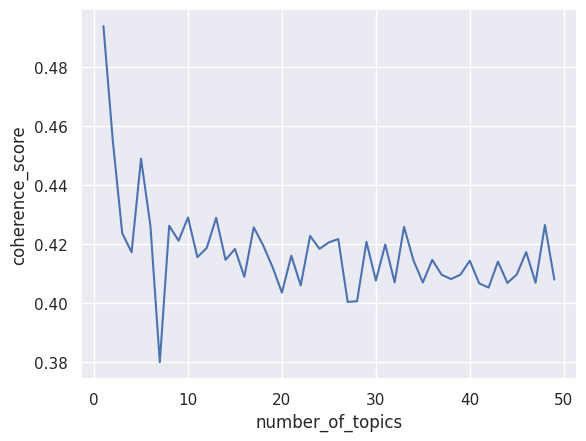

In [ ]:
# see https://towardsdatascience.com/hands-on-topic-modeling-with-python-1e3466d406d7
from gensim.models import CoherenceModel
from tqdm import tqdm

# Compute coherence score
number_of_topics = []
coherence_score = []
for i in tqdm(range(1,50)):
  lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           iterations=50,
                                           alpha='auto',
                                           num_topics=i)
  coherence_model_lda = CoherenceModel(model=lda_model,
                                       texts=docs,
                                       dictionary=id2word,
                                       coherence='c_v')
  coherence_lda = coherence_model_lda.get_coherence()
  number_of_topics.append(i)
  coherence_score.append(coherence_lda)

# Create a dataframe of coherence score by number of topics
topic_coherence = pd.DataFrame({'number_of_topics':number_of_topics,
                                'coherence_score':coherence_score})

# Print a line plot
sns.lineplot(data=topic_coherence, x='number_of_topics', y='coherence_score')

In [ ]:
topic_coherence

,number_of_topics,coherence_score
0,1,0.493942
1,2,0.454999
2,3,0.423707
3,4,0.417268
4,5,0.448996
5,6,0.426315
6,7,0.379967
7,8,0.426256
8,9,0.421164
9,10,0.429075


In [ ]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=47,
                                           update_every=1,
                                           chunksize=500,
                                           alpha='auto',
                                           iterations=200,
                                           per_word_topics=True)

In [ ]:
# print the keywords for each topic (created by ChatGPT)
for i in range(lda_model.num_topics):
    print("Topic #{}: {}".format(i+1, ", ".join([word[0] for word in lda_model.show_topic(i)])))


Topic #1: neuromodulatori, psychiatr, dopaminerg, psychiatri, dysfunct, pfc, schizophrenia, braver, rakic, dopamin
Topic #2: 31st, hinton, layer, unit, deep, backpropag, refer, preprint, zero, hidden
Topic #3: k2, kx, rademach, c0, bach, rd, pontil, hx, psd, kxk
Topic #4: china, beij, veli, russia, desynchron, meal, tabula, rasa, ccc, cnbc
Topic #5: rather, relat, form, introduct, current, repres, interpret, li, jl, even
Topic #6: ning, mose, glove, minski, bottl, claudio, michalski, mildli, tti, regret
Topic #7: semisupervis, jennif, seamlessli, yti, cremer, jojic, dyn, maxk, alternatingli, fda
Topic #8: abstract, introduct, respect, paper, make, addit, effect, would, repres, complex
Topic #9: xiang, liberti, girard, dolphin, deniz, spill, rot, rosch, neigh, hash
Topic #10: neuron, synapt, circuit, synaps, dynam, biolog, extern, attractor, hopfield, recurr
Topic #11: plo, arthur, schuster, record, brain, neuron, activ, wood, circuit, tempor
Topic #12: nishiyama, cshl, harbor, simul, e

In [ ]:
#!pip install pyLDAvis
#!pip install --upgrade pandas==1.2
#import pyLDAvis.gensim_models
#pyLDAvis.enable_notebook()
#vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
#vis


/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
#See also https://colab.research.google.com/drive/1FieRA9fLdkQEGDIMYl0I3MCjSUKVF8C-?usp=sharing#scrollTo=ScBUgXn06IK6
from bertopic import BERTopic
docs = df['paper_text'].values
topic_model = BERTopic(language="english", calculate_probabilities=True, verbose=True)
topics, probs = topic_model.fit_transform(docs)

Batches:   0%|          | 0/177 [00:00<?, ?it/s]

2023-04-25 08:16:22,827 - BERTopic - Transformed documents to Embeddings
2023-04-25 08:16:34,180 - BERTopic - Reduced dimensionality
2023-04-25 08:16:38,052 - BERTopic - Clustered reduced embeddings


In [ ]:
freq = topic_model.get_topic_info()
freq

,Topic,Count,Name
0,-1,1858,-1_the_of_and_to
1,0,221,0_image_object_images_and
2,1,203,1_convergence_gradient_convex_optimization
3,2,86,2_arm_regret_bandit_arms
4,3,84,3_matrix_completion_rank_entries
...,...,...,...
102,101,11,101_coding_sparse_dictionary_image
103,102,11,102_gh_op_ba_yz
104,103,11,103_lifted_mln_inference_formulas
105,104,10,104_regret_bandit_ft_algorithm


In [ ]:
topic_model.get_topic_info(0)

,Topic,Count,Name
0,0,221,0_image_object_images_and


In [ ]:
df['topic'] = topic_model.topics_
df['topic_info'] = df['topic'].apply(lambda t: topic_model.topic_labels_[t])
df[["title", 'topic_info']]

,title,topic_info
0,Self-Organization of Associative Database and ...,-1_the_of_and_to
2,Storing Covariance by the Associative Long-Ter...,-1_the_of_and_to
4,"Neural Network Ensembles, Cross Validation, an...",-1_the_of_and_to
5,Using a neural net to instantiate a deformable...,65_recognition_character_network_word
9,Pulsestream Synapses with Non-Volatile Analogu...,86_network_neural_output_networks
...,...,...
7224,On the Computational Utility of Consciousness,-1_the_of_and_to
7232,Learning with Product Units,18_state_states_survival_markov
7237,"Bias, Variance and the Combination of Least Sq...",-1_the_of_and_to
7239,Learning direction in global motion: two class...,16_cells_motion_visual_orientation


In [ ]:
topic_model.visualize_topics()

In [ ]:
topic_model.visualize_barchart(top_n_topics=10)

## 5. Named-Entity Recognition

Using entity extraction, we can find entities, such as persons, organizations, locations, dates, events and more.
In this notebook, we demonstrate how to use [spaCy](https://spacy.io) and [Stanford NER Tagger](https://nlp.stanford.edu/software/CRF-NER.shtml#Download) using [NLTK](https://www.nltk.org) to extract entities
from text. So before we start, let's install spaCy and NLTK:
```console
!pip install spaCy
!pip install nltk
```

**Note:** Using Stanford NER Tagger is a little trickier; more details can be found in the following [post](https://pythonprogramming.net/named-entity-recognition-stanford-ner-tagger/).

Let's check if we can extract entities from text using these packages. Let's start with spaCy:

In [ ]:
import spacy
from spacy import displacy
import en_core_web_sm
nlp = en_core_web_sm.load()
text = """
Elon Reeve Musk FRS (/ˈiːlɒn/ EE-lon; born June 28, 1971) is a business magnate and investor.
He is the founder, CEO and chief engineer of SpaceX; angel investor, CEO and product architect of Tesla, Inc.; owner and CEO of Twitter; founder of the Boring Company; co-founder of Neuralink and OpenAI; and president of the philanthropic Musk Foundation.
With an estimated net worth of around $192 billion as of March 27, 2023, primarily from his ownership stakes in Tesla and SpaceX,
Musk is the second-wealthiest person in the world, according to both the Bloomberg Billionaires Index and Forbes's real-time billionaires list.
Musk was born in Pretoria, South Africa, and briefly attended at the University of Pretoria before moving to Canada at age 18, acquiring citizenship through his Canadian-born mother.
Two years later, he matriculated at Queen's University and transferred to the University of Pennsylvania, where he received bachelor's degrees in economics and physics. He moved to California in 1995 to attend Stanford University. After two days, he dropped out and, with his brother Kimbal, co-founded the online city guide software company Zip2. In 1999, Zip2 was acquired by Compaq for $307 million and Musk co-founded X.com, a direct bank.
X.com merged with Confinity in 2000 to form PayPal, which eBay acquired for $1.5 billion in 2002.
Musk received an EB-5 investor green card in 1997, which led to his U.S. citizenship in 2002.[8]
"""
doc = nlp(text)
displacy.render(doc, style='ent', jupyter=True)

For better results we can use [a bigger model](https://spacy.io/models/en), but first we need to download it:


**Note:** We can visualize the different models parsing at the following [website](https://explosion.ai/demos/displacy-ent).

In [ ]:
!python -m spacy download en_core_web_lg

2023-04-25 08:56:17.625178: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 2.3 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


In [ ]:
import en_core_web_lg
nlp = en_core_web_lg.load()
doc = nlp(text)
displacy.render(doc, style='ent', jupyter=True)

Now let's try Stanford NER:

In [ ]:
# see also https://stackoverflow.com/questions/55129698/importing-stanfordner-tagger-google-colab

!wget 'https://nlp.stanford.edu/software/stanford-ner-4.2.0.zip'#'https://nlp.stanford.edu/software/stanford-ner-2018-10-16.zip'
!unzip stanford-ner-4.2.0.zip

--2023-04-25 09:02:35--  https://nlp.stanford.edu/software/stanford-ner-4.2.0.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 302 FOUND
Location: https://downloads.cs.stanford.edu/nlp/software/stanford-ner-4.2.0.zip [following]
--2023-04-25 09:02:35--  https://downloads.cs.stanford.edu/nlp/software/stanford-ner-4.2.0.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 180437064 (172M) [application/zip]
Saving to: ‘stanford-ner-4.2.0.zip’

stanford-ner-4.2.0. 100%[===================>] 172.08M  5.13MB/s    in 31s     

2023-04-25 09:03:07 (5.53 MB/s) - ‘stanford-ner-4.2.0.zip’ saved [180437064/180437064]

Archive:  stanford-ner-4.2.0.zip
   creating: stanford-ner-

In [ ]:
from nltk.tag import StanfordNERTagger
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')

st = StanfordNERTagger('./stanford-ner-2020-11-17/classifiers/english.all.3class.distsim.crf.ser.gz',
'./stanford-ner-2020-11-17/stanford-ner.jar',
encoding='utf-8')
tokenized_text = word_tokenize(text)
classified_text = st.tag(tokenized_text)

print([(w,e) for w,e in classified_text if e in {'PERSON', 'LOCATION', 'ORGANIZATION'}])

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


[('Elon', 'PERSON'), ('Reeve', 'PERSON'), ('Musk', 'PERSON'), ('SpaceX', 'ORGANIZATION'), ('Tesla', 'ORGANIZATION'), (',', 'ORGANIZATION'), ('Inc.', 'ORGANIZATION'), ('Twitter', 'ORGANIZATION'), ('Boring', 'ORGANIZATION'), ('Company', 'ORGANIZATION'), ('Neuralink', 'LOCATION'), ('Musk', 'ORGANIZATION'), ('Foundation', 'ORGANIZATION'), ('Tesla', 'LOCATION'), ('SpaceX', 'ORGANIZATION'), ('Musk', 'PERSON'), ('Bloomberg', 'ORGANIZATION'), ('Billionaires', 'ORGANIZATION'), ('Index', 'ORGANIZATION'), ('Forbes', 'PERSON'), ('Musk', 'PERSON'), ('Pretoria', 'LOCATION'), ('South', 'LOCATION'), ('Africa', 'LOCATION'), ('University', 'ORGANIZATION'), ('of', 'ORGANIZATION'), ('Pretoria', 'ORGANIZATION'), ('Canada', 'LOCATION'), ('Queen', 'ORGANIZATION'), ("'s", 'ORGANIZATION'), ('University', 'ORGANIZATION'), ('University', 'ORGANIZATION'), ('of', 'ORGANIZATION'), ('Pennsylvania', 'ORGANIZATION'), ('California', 'LOCATION'), ('Stanford', 'ORGANIZATION'), ('University', 'ORGANIZATION'), ('Kimbal', '

In [ ]:
#!pip install allennlp_models
import allennlp_models.tagging

# Instantiate the NER model
model = allennlp_models.tagging.SentenceTaggerPredictor.from_path("https://storage.googleapis.com/allennlp-public-models/ner-model-2020.02.10.tar.gz")

# Use the model to predict the named entities in the input text
predictions = model.predict(text)

# Print the predicted named entities
print(predictions["tags"])

Output()

Output()

Output()

['B-PER', 'I-PER', 'I-PER', 'L-PER', 'O', 'B-ORG', 'L-ORG', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'U-ORG', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-ORG', 'I-ORG', 'L-ORG', 'O', 'O', 'O', 'O', 'O', 'U-ORG', 'O', 'O', 'O', 'O', 'B-ORG', 'L-ORG', 'O', 'U-ORG', 'O', 'O', 'O', 'U-ORG', 'O', 'U-ORG', 'O', 'O', 'O', 'O', 'O', 'O', 'B-ORG', 'L-ORG', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'U-ORG', 'O', 'U-ORG', 'O', 'U-PER', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-ORG', 'I-ORG', 'L-ORG', 'O', 'U-ORG', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'U-PER', 'O', 'O', 'O', 'U-LOC', 'O', 'B-LOC', 'L-LOC', 'O', 'O', 'O', 'O', 'O', 'O', 'B-ORG', 'I-ORG', 'L-ORG', 'O', 'O', 'O', 'U-LOC', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'U-MISC', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-ORG', 'I-

In [ ]:
#Written by ChatGPT
# Extract the entities and their types
entities = []
current_entity = ""
current_tag = ""
for i, tag in enumerate(tags):
    if tag != "O":
        # If the current word is part of an entity, add it to the entity string
        current_entity += words[i] + " "
        if current_tag == "":
            # If this is the first word in the entity, set the entity tag
            current_tag = tag
        if i == len(tags) - 1 or tags[i+1] != current_tag:
            # If this is the last word in the entity, add the entity and its tag to the list of entities
            entities.append((current_entity.strip(), current_tag))
            current_entity = ""
            current_tag = ""
    else:
        # If the current word is not part of an entity, reset the entity string and tag
        current_entity = ""
        current_tag = ""

# Print the predicted named entities and their corresponding words and tags
for entity, tag in entities:
    print(f"{entity}: {tag}")

Elon: B-PER
Reeve Musk: I-PER
FRS: L-PER
/ˈiːlɒn/: B-ORG
EE: L-ORG
SpaceX: U-ORG
Tesla: B-ORG
,: I-ORG
Inc.: L-ORG
Twitter: U-ORG
Boring: B-ORG
Company: L-ORG
co: U-ORG
Neuralink: U-ORG
OpenAI: U-ORG
Musk: B-ORG
Foundation: L-ORG
Tesla: U-ORG
SpaceX: U-ORG
Musk: U-PER
Bloomberg: B-ORG
Billionaires: I-ORG
Index: L-ORG
Forbes: U-ORG
Musk: U-PER
Pretoria: U-LOC
South: B-LOC
Africa: L-LOC
University: B-ORG
of: I-ORG
Pretoria: L-ORG
Canada: U-LOC
Canadian: U-MISC
Queen: B-ORG
's: I-ORG
University: L-ORG
University: B-ORG
of: I-ORG
Pennsylvania: L-ORG
California: U-LOC
Stanford: B-ORG
University: L-ORG
Kimbal: U-PER
Zip2: U-ORG
Zip2: U-ORG
Compaq: U-ORG
Musk: B-ORG
co: L-ORG
X.com: U-ORG
X.com: U-ORG
Confinity: U-ORG
PayPal: U-ORG
eBay: U-ORG
Musk: U-PER
EB-5: U-MISC
U.S.: U-LOC


Let's use entity extraction to find the most common entities in the [Hilary Clinton's emails dataset](https://www.kaggle.com/kaggle/hillary-clinton-emails):

In [ ]:
!mkdir ./datasets/hillary-clinton-emails

# download the dataset from Kaggle and unzip it
!kaggle datasets download kaggle/hillary-clinton-emails -f emails.csv  -p ./datasets/hillary-clinton-emails
!unzip ./datasets/hillary-clinton-emails/*.zip  -d ./datasets/hillary-clinton-emails/


 86% 5.00M/5.80M [00:00<00:00, 21.0MB/s]
100% 5.80M/5.80M [00:00<00:00, 24.0MB/s]
Archive:  ./datasets/hillary-clinton-emails/Emails.csv.zip
  inflating: ./datasets/hillary-clinton-emails/Emails.csv  


In [ ]:
import pandas as pd

df = pd.read_csv("./datasets/hillary-clinton-emails/Emails.csv")
df

,Id,DocNumber,MetadataSubject,MetadataTo,MetadataFrom,SenderPersonId,MetadataDateSent,MetadataDateReleased,MetadataPdfLink,MetadataCaseNumber,...,ExtractedTo,ExtractedFrom,ExtractedCc,ExtractedDateSent,ExtractedCaseNumber,ExtractedDocNumber,ExtractedDateReleased,ExtractedReleaseInPartOrFull,ExtractedBodyText,RawText
0,1,C05739545,WOW,H,"Sullivan, Jacob J",87.0,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739545...,F-2015-04841,...,NaN,"Sullivan, Jacob J <Sullivan11@state.gov>",NaN,"Wednesday, September 12, 2012 10:16 AM",F-2015-04841,C05739545,05/13/2015,RELEASE IN FULL,NaN,UNCLASSIFIED\nU.S. Department of State\nCase N...
1,2,C05739546,H: LATEST: HOW SYRIA IS AIDING QADDAFI AND MOR...,H,NaN,NaN,2011-03-03T05:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH1/DOC_0C05739546...,F-2015-04841,...,NaN,NaN,NaN,NaN,F-2015-04841,C05739546,05/13/2015,RELEASE IN PART,"B6\nThursday, March 3, 2011 9:45 PM\nH: Latest...",UNCLASSIFIED\nU.S. Department of State\nCase N...
2,3,C05739547,CHRIS STEVENS,;H,"Mills, Cheryl D",32.0,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739547...,F-2015-04841,...,B6,"Mills, Cheryl D <MillsCD@state.gov>","Abedin, Huma","Wednesday, September 12, 2012 11:52 AM",F-2015-04841,C05739547,05/14/2015,RELEASE IN PART,Thx,UNCLASSIFIED\nU.S. Department of State\nCase N...
3,4,C05739550,CAIRO CONDEMNATION - FINAL,H,"Mills, Cheryl D",32.0,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739550...,F-2015-04841,...,NaN,"Mills, Cheryl D <MillsCD@state.gov>","Mitchell, Andrew B","Wednesday, September 12,2012 12:44 PM",F-2015-04841,C05739550,05/13/2015,RELEASE IN PART,NaN,UNCLASSIFIED\nU.S. Department of State\nCase N...
4,5,C05739554,H: LATEST: HOW SYRIA IS AIDING QADDAFI AND MOR...,"Abedin, Huma",H,80.0,2011-03-11T05:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH1/DOC_0C05739554...,F-2015-04841,...,NaN,NaN,NaN,NaN,F-2015-04841,C05739554,05/13/2015,RELEASE IN PART,"H <hrod17@clintonemail.com>\nFriday, March 11,...",B6\nUNCLASSIFIED\nU.S. Department of State\nCa...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7940,7941,C05778462,WYDEN,H,"Verma, Richard R",180.0,2010-12-16T05:00:00+00:00,2015-08-31T04:00:00+00:00,DOCUMENTS/HRCEmail_August_Web/IPS-0113/DOC_0C0...,F-2014-20439,...,NaN,"Verma, Richard R <VermaRR@state.gov>",NaN,"Thursday, December 16, 2010 7:41 PM",F-2014-20439,C05778462,08/31/2015,RELEASE IN PART,NaN,UNCLASSIFIED U.S. Department of State Case No....
7941,7942,C05778463,SENATE,H,"Verma, Richard R",180.0,2010-12-16T05:00:00+00:00,2015-08-31T04:00:00+00:00,DOCUMENTS/HRCEmail_August_Web/IPS-0113/DOC_0C0...,F-2014-20439,...,NaN,"Verma, Richard R <VermaRR@state.gov>","Sullivan, Jacob J; Mills, Cheryl D; Abedin, Huma","Thursday, December 16, 2010 8:09 PM",F-2014-20439,C05778463,08/31/2015,RELEASE IN FULL,Big change of plans in the Senate. Senator Rei...,UNCLASSIFIED U.S. Department of State Case No....
7942,7943,C05778465,RICHARD (TNR),H,"Jiloty, Lauren C",116.0,2010-12-16T05:00:00+00:00,2015-08-31T04:00:00+00:00,DOCUMENTS/HRCEmail_August_Web/IPS-0113/DOC_0C0...,F-2014-20439,...,NaN,"Jiloty, Lauren C <JilotyLC@state.gov>",NaN,"Thursday, December 16, 2010 10:52 PM",F-2014-20439,C05778465,08/31/2015,RELEASE IN PART,NaN,UNCLASSIFIED U.S. Department of State Case No....
7943,7944,C05778466,FROM,H,PVerveer,143.0,2012-12-17T05:00:00+00:00,2015-08-31T04:00:00+00:00,DOCUMENTS/HRCEmail_August_Web/IPS-0113/DOC_0C0...,F-2014-20439,...,"PVervee,",NaN,NaN,12/14/201,F-2014-20439,C05778466,08/31/2015,RELEASE IN PART,"PVerveer B6\nFriday, December 17, 2010 12:12 A...","Hi dear Melanne and Alyse,\nHope this email re..."


Let's extract all the entities from the raw text:

In [ ]:
nlp = en_core_web_sm.load()

def get_entites_from_text(text):
    entities_dict= {}
    #using spaCy to get entities
    doc = nlp(text)
    for entity in doc.ents:
        label = entity.label_
        if  label not in entities_dict:
            entities_dict[label] = set()
        entities_dict[label].add(entity.text)

    return entities_dict


#can take some time
df['NerDict'] = df['RawText'].apply(lambda t: get_entites_from_text(t))
df['NerDict'][0]

{'ORG': {'Christian (Armed Services', 'U.S. Department of State\nCase No'},
 'PERSON': {'F-2015-04841',
  'FOIA WAIVER',
  'Jacob J\n',
  'Jacob J <',
  'McCain',
  'Sullivan'},
 'DATE': {'Wednesday, September 12, 2012',
  'Wednesday, September 12, 2012 10:16 AM'},
 'TIME': {'10:09 AM'}}

In [ ]:
count_entities_dict = {}
for d in df['NerDict']:
    for entity_type, entity_set in d.items():
        if entity_type not in count_entities_dict:
            count_entities_dict[entity_type] = {}
        for name in entity_set:
            name = name.replace("\n", " ").strip().lower()
            if name not in count_entities_dict[entity_type]:
                count_entities_dict[entity_type][name] = 0
            count_entities_dict[entity_type][name] += 1

count_entities_dict


{'ORG': {'u.s. department of state case no': 325,
  'christian (armed services': 1,
  'the air force': 8,
  'libyan army': 9,
  'nlc': 4,
  'the national libyan council': 4,
  'administration': 81,
  'the international criminal court': 6,
  'un': 327,
  'air forces': 3,
  'the libyan air force': 2,
  'unclassified u.s. department of state case no.': 126,
  'the european union': 54,
  'the syrian air force': 3,
  'civil': 3,
  "air force's intelligence": 3,
  'i. report': 3,
  'realistically': 4,
  'egyptian special forces': 4,
  'nasserite': 3,
  'the external security organization': 3,
  'the libyan army': 7,
  'huma subject': 227,
  'huma': 391,
  'ads': 1,
  'nea-press-dl': 8,
  'nea-egypt': 1,
  'state-scb0045249 \x0cunclassified u.s. department of state case no.': 1,
  'ranz': 1,
  'u.s. department of state case': 7760,
  'u.s. department of state unclassifif81 c street nw': 1,
  'u.s. department of state case no f-2015-04841': 2,
  'il': 2,
  'libyan air force': 1,
  'kssad': 1,


In [ ]:
count_entities_dict.keys()

dict_keys(['ORG', 'PERSON', 'DATE', 'TIME', 'CARDINAL', 'GPE', 'NORP', 'LOC', 'ORDINAL', 'WORK_OF_ART', 'LANGUAGE', 'MONEY', 'PRODUCT', 'EVENT', 'FAC', 'LAW', 'QUANTITY', 'PERCENT'])

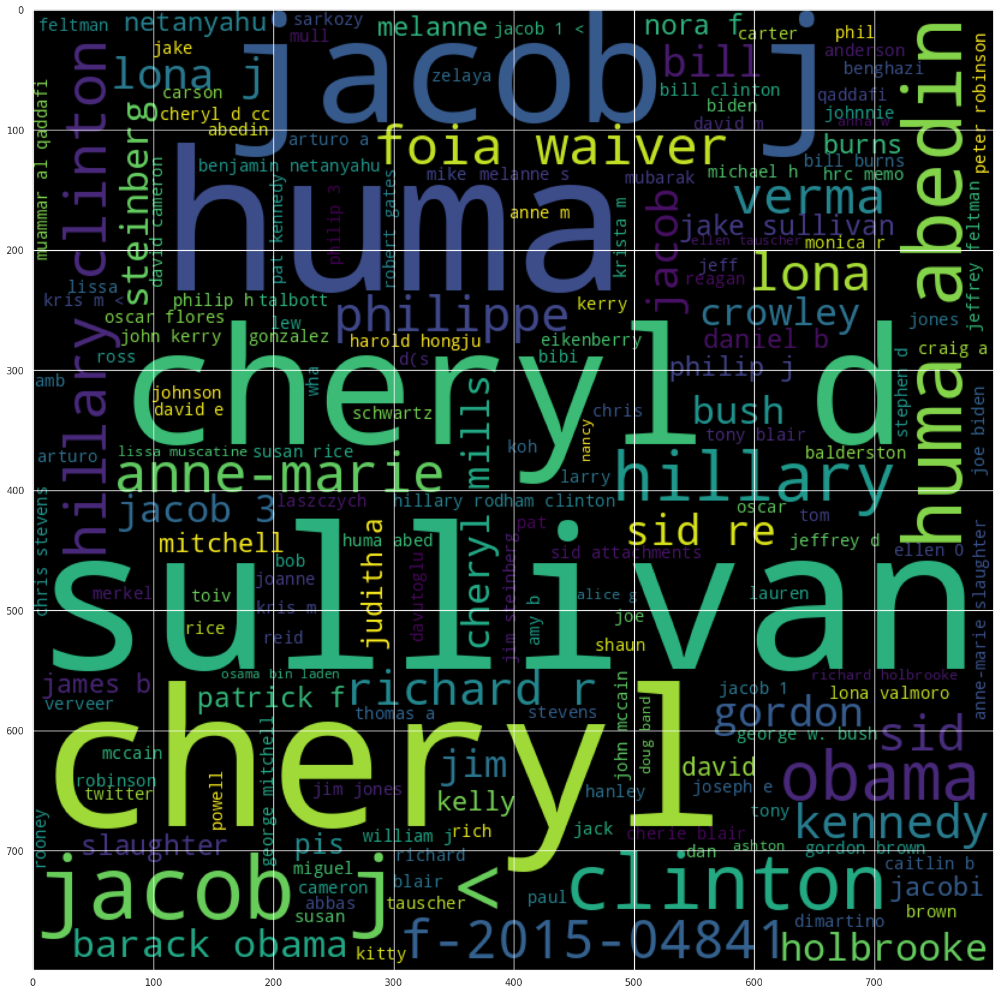

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline

def draw_entities_word_cloud(entity_type, min_times=10):
    stopwords = set(STOPWORDS) | {"doc", "date","memo", "subject", 'state',
                                 }
    stopwords_parts = {"sent", "subject", "original message", "unclassified" }
    wordcloud = WordCloud(width = 800, height = 800,
                    background_color ='black',
                    stopwords = stopwords,
                    min_font_size = 10)
    def skip_entity(e):
        if e in stopwords:
            return True
        for p in stopwords_parts:
            if p in e:
                return True
        return False

    # using the subject frquencies
    d = {k:v for k,v in count_entities_dict[entity_type].items() if v > min_times and not skip_entity(k)}
    wordcloud.generate_from_frequencies(frequencies=d)
    plt.figure(figsize = (20, 20), facecolor = None)
    plt.imshow(wordcloud)
draw_entities_word_cloud("PERSON",10)

So, from the above word cloud, we can observe the most frequent person's names that appeared in Hillary's emails.
Let's look at other entity types:

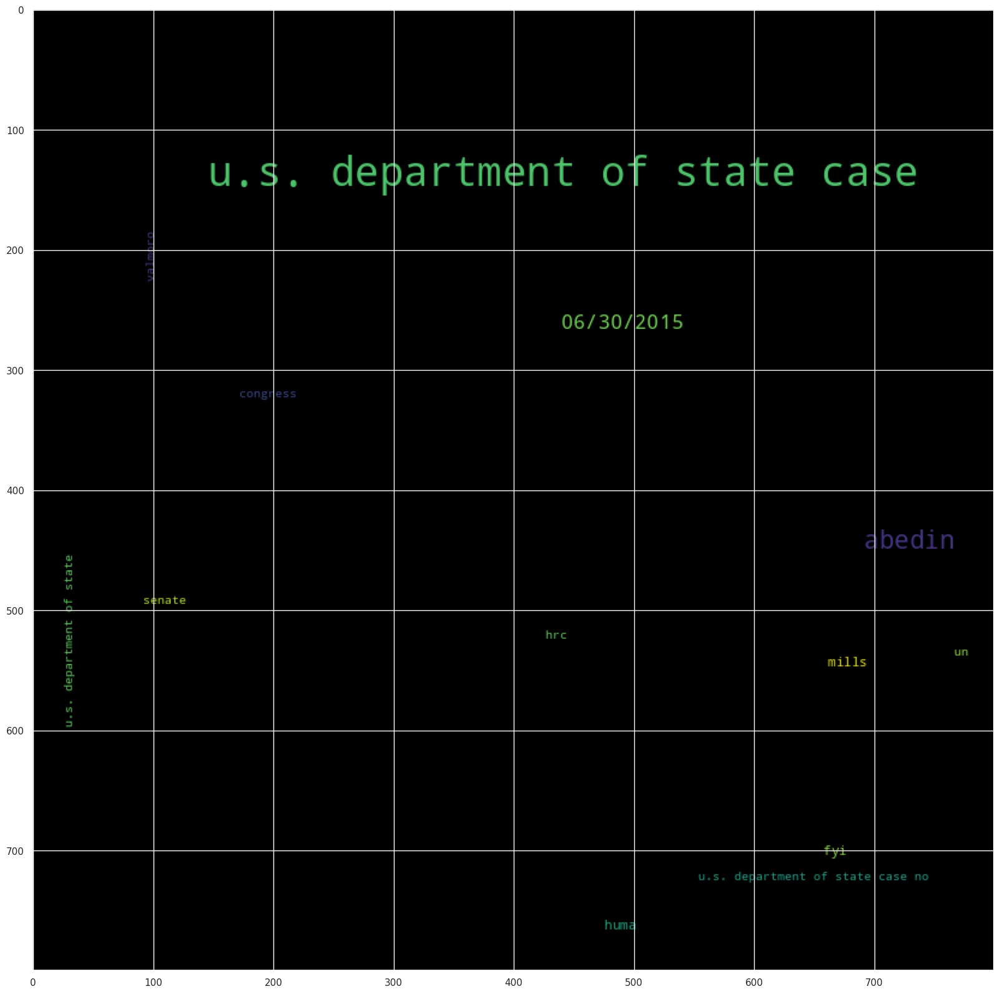

In [ ]:
draw_entities_word_cloud("ORG",5)

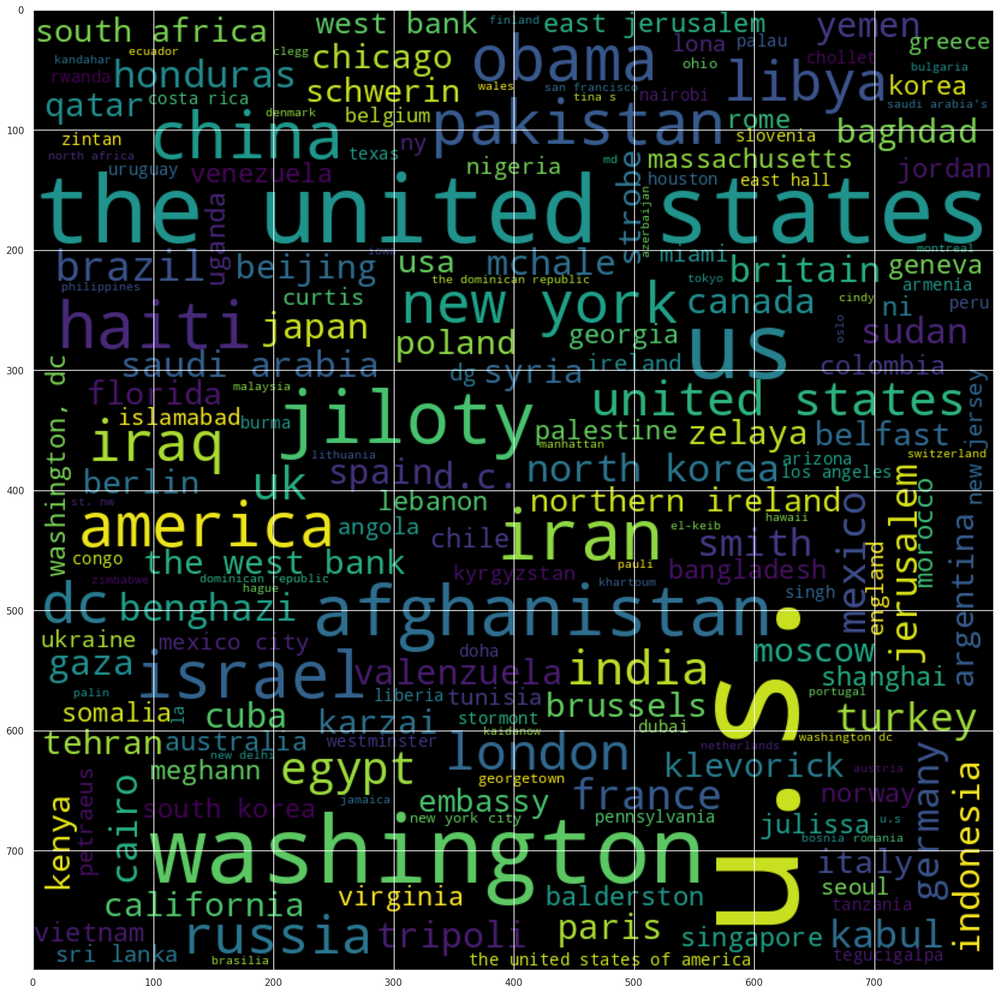

In [ ]:
draw_entities_word_cloud("GPE",5)

From the above, in only a few lines of code, we can learn a lot about influential people and locations according to emails.
For instance, we can see the places and locations that are mentioned the highest number of times in her emails.

We can use information-retrieval  algorithms to find the most relevant documents in a specific subject:

In [ ]:
!pip install rank_bm25
from rank_bm25 import BM25Okapi

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
corpus = df["RawText"]
tokenized_corpus = [doc.lower().split(" ") for doc in corpus]
bm25 = BM25Okapi(tokenized_corpus)

In [ ]:
query = "Abedin Huma"
tokenized_query = query.split(" ")
for t in bm25.get_top_n(tokenized_query, corpus, n=2):
  print(t)

UNCLASSIFIED U.S. Department of State Case No. F-2014-20439 Doc No. C05778470 Date: 08/31/2015
RELEASE IN
FULL
From: Sullivan, Jacob J <SullivanJJ@state.gov>
Sent: Friday, December 17, 2010 10:42 AM
To:
Cc: Abedin, Huma
Subject: FW: Note for Secretary Clinton
Attachments: President Karzaijpg
See below.
From: Eikenberry, Karl W
Sent: Friday, December 17, 2010 10:11 AM
To: Mills, Cheryl D; Ruggiero, Frank 3; Sullivan, Jacob 3
Cc: Wayne, E Anthony
Subject: Note for Secretary Clinton
Madam Secretary,
The outpouring of condolences from the international community and the Afghans for Richard's passing has been
extraordinary. We have had a steady flow of visitors from the NATO and diplomatic community and, most importantly,
Afghans of every walk of life for several days who have come to sign the condolence book.
Today, during my weekly meeting with President Karzai, I took along the condolence book to be signed at the
Palace. President Karzai signed and wrote a nice tribute to Richard and gra

## 6. Sentiment Analysis

### 6.1 Coursera's Course Reviews Dataset

In this section, we are going to construct a sentiment classifier using various datasets.
Let's first download the [100K Coursera's Course Reviews Dataset](https://www.kaggle.com/septa97/100k-courseras-course-reviews-dataset), and load it into an SFrame object:
    

In [ ]:
!mkdir ./datasets
!mkdir ./datasets/100k-courseras-course-reviews-dataset

# download the dataset from Kaggle and unzip it
!kaggle datasets download septa97/100k-courseras-course-reviews-dataset -f reviews.csv  -p ./datasets/100k-courseras-course-reviews-dataset
!unzip ./datasets/100k-courseras-course-reviews-dataset/*.zip  -d ./datasets/100k-courseras-course-reviews-dataset/

 91% 5.00M/5.50M [00:00<00:00, 47.9MB/s]
100% 5.50M/5.50M [00:00<00:00, 51.8MB/s]
Archive:  ./datasets/100k-courseras-course-reviews-dataset/reviews.csv.zip
  inflating: ./datasets/100k-courseras-course-reviews-dataset/reviews.csv  


In [ ]:
import pandas as pd
df = pd.read_csv("./datasets/100k-courseras-course-reviews-dataset/reviews.csv")
df

,Id,Review,Label
0,0,good and interesting,5
1,1,"This class is very helpful to me. Currently, I...",5
2,2,like!Prof and TAs are helpful and the discussi...,5
3,3,Easy to follow and includes a lot basic and im...,5
4,4,Really nice teacher!I could got the point eazl...,4
...,...,...,...
107013,107013,Trendy topic with talks from expertises in the...,4
107014,107014,"Wonderful! Simple and clear language, good ins...",5
107015,107015,an interesting and fun course. thanks. dr quincy,5
107016,107016,"very broad perspective, up to date information...",4


Let visualize the distributions of the ratings:

<Axes: xlabel='Label', ylabel='Count'>

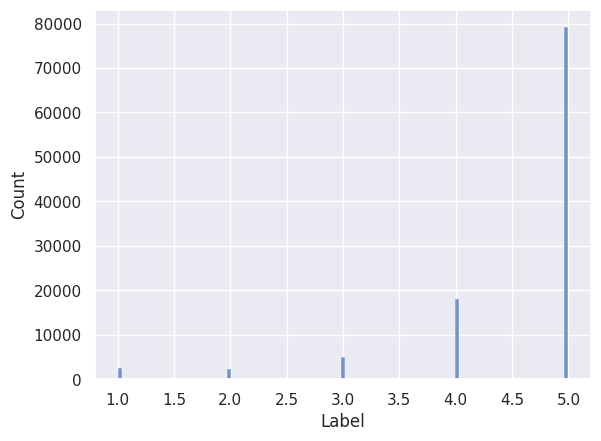

In [ ]:
import seaborn as sns
sns.set()
sns.histplot(df['Label'], kde=False)

In [ ]:
df.groupby('Label').size()

Label
1     2469
2     2251
3     5071
4    18054
5    79173
dtype: int64

We can see that vast number of reviews contain positive  sentiments.
Let's define reviews with a score of 4 & 5 as positive  sentiment reviews and reviews
with a score of 1 & 2 as negative sentiment reviews:

In [ ]:
df = df[df['Label'] != 3]
def label2sentiment(label):
    if label >= 4:
        return "Positive"
    else:
        return "Negative"

df['sentiment'] = df['Label'].apply(lambda label: label2sentiment(label))
df

<ipython-input-2-2acca2a844a6>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['sentiment'] = df['Label'].apply(lambda label: label2sentiment(label))


,Id,Review,Label,sentiment
0,0,good and interesting,5,Positive
1,1,"This class is very helpful to me. Currently, I...",5,Positive
2,2,like!Prof and TAs are helpful and the discussi...,5,Positive
3,3,Easy to follow and includes a lot basic and im...,5,Positive
4,4,Really nice teacher!I could got the point eazl...,4,Positive
...,...,...,...,...
107013,107013,Trendy topic with talks from expertises in the...,4,Positive
107014,107014,"Wonderful! Simple and clear language, good ins...",5,Positive
107015,107015,an interesting and fun course. thanks. dr quincy,5,Positive
107016,107016,"very broad perspective, up to date information...",4,Positive


In [ ]:
df.groupby('sentiment').size()

sentiment
Negative     4720
Positive    97227
dtype: int64

Let's extract TF-IDF features and construct a sentiment classifier:

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
model = TfidfVectorizer(max_features = 2000, stop_words='english')
X = model.fit_transform(df.Review).toarray()
len(X)

101947

In [ ]:
tf_idf_df = pd.DataFrame(data = X, columns = model.get_feature_names_out())
tf_idf_df

,10,100,11,12,15,20,2nd,30,3d,abilities,...,www,xml,yaakov,yale,year,years,yes,young,youtube,zero
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
101943,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
101944,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
101945,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

X_train, X_test, y_train, y_test = train_test_split(X, df['sentiment'], test_size=0.33, random_state=42)
clf = RandomForestClassifier(max_depth=2, random_state=0, n_jobs=-1)

In [ ]:
from sklearn.metrics import accuracy_score
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)
print(accuracy_score(y_test,y_predict))

0.9522337484766519


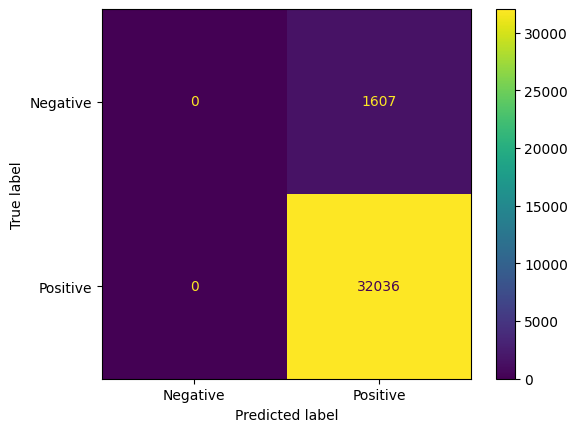

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_predict, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot()

In [ ]:
# This is to make things "simple" don't use this for real-world work :)
neg_df = df[df.sentiment == "Negative"]
pos_df = df[df.sentiment == "Positive"]

train_df = pd.concat([neg_df.head(3500), pos_df.head(3500)])
test_df = pd.concat([neg_df.tail(500), pos_df.tail(500)])
train_df

,Id,Review,Label,sentiment
17,17,This course does not say anything about digiti...,2,Negative
49,49,This course doesn't contain any new informatio...,1,Negative
70,70,"While there is some interesting content, parti...",2,Negative
71,71,I do not find very interesting this course. to...,1,Negative
79,79,A lot of speaking without any sense. Skip it a...,1,Negative
...,...,...,...,...
3870,3870,A good pstart to know about Arduino and C Prog...,5,Positive
3871,3871,really good,4,Positive
3872,3872,Very good introduction to the Arduino platform.,5,Positive
3873,3873,Great course for an easy introduction to Ardui...,5,Positive


In [ ]:
model = TfidfVectorizer(max_features = 5000, stop_words='english')
X_train = model.fit_transform(train_df.Review).toarray()
X_test = model.transform(test_df.Review).toarray()
clf = RandomForestClassifier(max_depth=4, random_state=0, n_jobs=-1)
clf.fit(X_train, train_df.sentiment)


In [ ]:
y_predict = clf.predict(X_test)
y_predict

array(['Negative', 'Negative', 'Positive', 'Positive', 'Negative',
       'Positive', 'Negative', 'Negative', 'Positive', 'Negative',
       'Negative', 'Positive', 'Positive', 'Negative', 'Positive',
       'Positive', 'Positive', 'Negative', 'Positive', 'Positive',
       'Positive', 'Positive', 'Positive', 'Negative', 'Positive',
       'Negative', 'Positive', 'Negative', 'Negative', 'Negative',
       'Negative', 'Negative', 'Negative', 'Negative', 'Positive',
       'Negative', 'Negative', 'Positive', 'Positive', 'Negative',
       'Positive', 'Positive', 'Negative', 'Positive', 'Positive',
       'Negative', 'Positive', 'Negative', 'Negative', 'Positive',
       'Negative', 'Positive', 'Negative', 'Positive', 'Negative',
       'Positive', 'Negative', 'Negative', 'Positive', 'Negative',
       'Negative', 'Negative', 'Negative', 'Negative', 'Negative',
       'Positive', 'Negative', 'Negative', 'Positive', 'Negative',
       'Positive', 'Negative', 'Positive', 'Negative', 'Positi

We got some logical predictions:

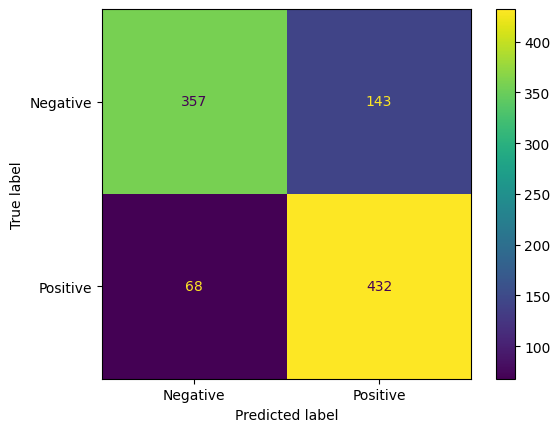

In [ ]:
y_test = test_df.sentiment
cm = confusion_matrix(y_test, y_predict, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot()

In [ ]:
print(accuracy_score(y_test,y_predict))

0.789


Let's try to improve our classifier a little more. First let's lower case the strings and remove stopwords from the
1-grams:

We can also use other Python packages that use a wordlist-based approach for sentiment analysis.
For each review, let's add a score column using the
[Afinn package](https://github.com/fnielsen/afinn):


In [ ]:
!pip install afinn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for afinn: filename=afinn-0.1-py3-none-any.whl size=53448 sha256=f108fa67088bd908dcdf725e3fe4a164b33d81a621026463bc449530ca1c9324
  Stored in directory: /root/.cache/pip/wheels/79/91/ee/8374d9bc8c6c0896a2db75afdfd63d43653902407a0e76cd94
Successfully built afinn


In [ ]:
from afinn import Afinn
afinn = Afinn()

train_df['afinn_score'] = train_df['Review'].apply(lambda t: afinn.score(t))
test_df['afinn_score'] = test_df['Review'].apply(lambda t: afinn.score(t))
train_df

,Id,Review,Label,sentiment,afinn_score
17,17,This course does not say anything about digiti...,2,Negative,0.0
49,49,This course doesn't contain any new informatio...,1,Negative,2.0
70,70,"While there is some interesting content, parti...",2,Negative,9.0
71,71,I do not find very interesting this course. to...,1,Negative,2.0
79,79,A lot of speaking without any sense. Skip it a...,1,Negative,0.0
...,...,...,...,...,...
3870,3870,A good pstart to know about Arduino and C Prog...,5,Positive,3.0
3871,3871,really good,4,Positive,3.0
3872,3872,Very good introduction to the Arduino platform.,5,Positive,3.0
3873,3873,Great course for an easy introduction to Ardui...,5,Positive,4.0


Let's check if our classifier indeed improved:

In [ ]:
X_train = pd.DataFrame(data = X_train, columns = model.get_feature_names_out())
X_test = pd.DataFrame(data = X_test, columns = model.get_feature_names_out())
X_train["afinn_score"] = train_df["afinn_score"]
X_test["afinn_score"] = test_df["afinn_score"]

In [ ]:
clf = RandomForestClassifier(max_depth=4, random_state=0, n_jobs=-1)
clf.fit(X_train, train_df.sentiment)

ValueError: ignored

In [ ]:
#X_train = X_train.fillna(-999999)
# X_test= X_test.fillna(-999999)
clf.fit(X_train, train_df.sentiment)
y_predict = clf.predict(X_test)
print(accuracy_score(y_test,y_predict))

0.691


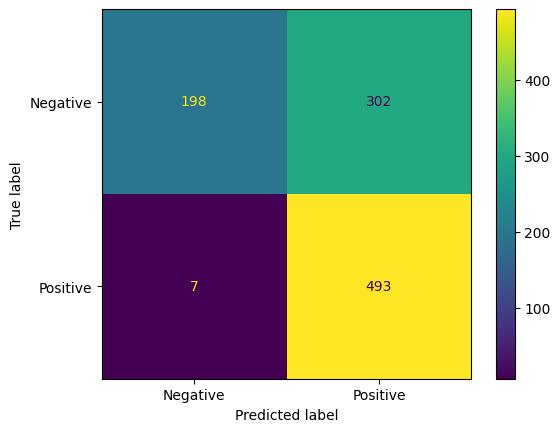

In [ ]:
y_test = test_df.sentiment
cm = confusion_matrix(y_test, y_predict, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot()

The classifier became more accurate in detecting positive reviews but less accurate in detecting negative reviews

### 6.2 Hotel Review Dataset

Let's use the data from this dataset to evaluate the sentiment on the [Hotel Review dataset](https://www.kaggle.com/anu0012/hotel-review):

In [ ]:
!mkdir ./datasets/hotel-review

# download the dataset from Kaggle and unzip it
!kaggle datasets download anu0012/hotel-review -p ./datasets/hotel-review
!unzip ./datasets/hotel-review/*.zip  -d ./datasets/hotel-review/

mkdir: cannot create directory ‘./datasets/hotel-review’: No such file or directory
 78% 17.0M/21.7M [00:00<00:00, 76.9MB/s]
100% 21.7M/21.7M [00:00<00:00, 86.9MB/s]
Archive:  ./datasets/hotel-review/hotel-review.zip
  inflating: ./datasets/hotel-review/test.csv  
  inflating: ./datasets/hotel-review/train.csv  


In [ ]:
import pandas as pd
h_df = pd.read_csv("./datasets/hotel-review/train.csv")
h_df

,User_ID,Description,Browser_Used,Device_Used,Is_Response
0,id10326,The room was kind of clean but had a VERY stro...,Edge,Mobile,not happy
1,id10327,I stayed at the Crown Plaza April -- - April -...,Internet Explorer,Mobile,not happy
2,id10328,I booked this hotel through Hotwire at the low...,Mozilla,Tablet,not happy
3,id10329,Stayed here with husband and sons on the way t...,InternetExplorer,Desktop,happy
4,id10330,My girlfriends and I stayed here to celebrate ...,Edge,Tablet,not happy
...,...,...,...,...,...
38927,id49253,We arrived late at night and walked in to a ch...,Edge,Desktop,happy
38928,id49254,The only positive impression is location and p...,InternetExplorer,Mobile,not happy
38929,id49255,Traveling with friends for shopping and a show...,Firefox,Mobile,not happy
38930,id49256,The experience was just ok. We paid extra for ...,Chrome,Desktop,not happy


Let's use [Hugging Face](https://huggingface.co/) pretrained models:

In [ ]:
# See also: https://huggingface.co/siebert/sentiment-roberta-large-english
!pip install -q transformers
from transformers import pipeline
sentiment_analysis = pipeline("sentiment-analysis",model="siebert/sentiment-roberta-large-english")
data = ["I love you", "I hate you"]
sentiment_analysis(data)

[{'label': 'POSITIVE', 'score': 0.998561680316925},
 {'label': 'NEGATIVE', 'score': 0.9991401433944702}]

In [ ]:
sentiment_list = list(h_df.Description.values)
sentiments_list = sentiment_analysis(l)
sentiments_list

Token indices sequence length is longer than the specified maximum sequence length for this model (646 > 512). Running this sequence through the model will result in indexing errors


RuntimeError: ignored

In [ ]:
sentiment_list = []

for t in h_df.Description.values:
  if len(t) >514:
    sentiment_list.append(t[:514]) # truncate the string
  else:
    sentiment_list.append(t)


In [ ]:
%%timeit
sentiments_list = sentiment_analysis(sentiment_list[:100])

1min 27s ± 2.22 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


Let's add some GPU magic:

In [ ]:
import torch
torch.cuda.is_available()

True

In [ ]:
%%timeit
sentiment_analysis = pipeline("sentiment-analysis",model="siebert/sentiment-roberta-large-english", device=0)
sentiments_list = sentiment_analysis(sentiment_list[:100])

6.24 s ± 251 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [ ]:
# Use: watch nvidia-smi
sentiment_analysis = pipeline("sentiment-analysis",model="siebert/sentiment-roberta-large-english", device=0)
sentiments_list = sentiment_analysis(sentiment_list)


In [ ]:
h_df['sentiment'] = sentiments_list
h_df

,User_ID,Description,Browser_Used,Device_Used,Is_Response,sentiment
0,id10326,The room was kind of clean but had a VERY stro...,Edge,Mobile,not happy,"{'label': 'NEGATIVE', 'score': 0.9994603991508..."
1,id10327,I stayed at the Crown Plaza April -- - April -...,Internet Explorer,Mobile,not happy,"{'label': 'POSITIVE', 'score': 0.9987078905105..."
2,id10328,I booked this hotel through Hotwire at the low...,Mozilla,Tablet,not happy,"{'label': 'NEGATIVE', 'score': 0.9992838501930..."
3,id10329,Stayed here with husband and sons on the way t...,InternetExplorer,Desktop,happy,"{'label': 'POSITIVE', 'score': 0.9989135265350..."
4,id10330,My girlfriends and I stayed here to celebrate ...,Edge,Tablet,not happy,"{'label': 'NEGATIVE', 'score': 0.9995030164718..."
...,...,...,...,...,...,...
38927,id49253,We arrived late at night and walked in to a ch...,Edge,Desktop,happy,"{'label': 'POSITIVE', 'score': 0.9978922009468..."
38928,id49254,The only positive impression is location and p...,InternetExplorer,Mobile,not happy,"{'label': 'NEGATIVE', 'score': 0.9989101886749..."
38929,id49255,Traveling with friends for shopping and a show...,Firefox,Mobile,not happy,"{'label': 'NEGATIVE', 'score': 0.9994644522666..."
38930,id49256,The experience was just ok. We paid extra for ...,Chrome,Desktop,not happy,"{'label': 'NEGATIVE', 'score': 0.9994151592254..."


In [ ]:
diff_df = h_df[h_df.apply(lambda r: r["Is_Response"] == "not happy" and r['sentiment']['label']=="POSITIVE", axis=1)]
diff_df

,User_ID,Description,Browser_Used,Device_Used,Is_Response,sentiment
1,id10327,I stayed at the Crown Plaza April -- - April -...,Internet Explorer,Mobile,not happy,"{'label': 'POSITIVE', 'score': 0.9987078905105..."
6,id10332,My husband and I have stayed in this hotel a f...,Firefox,Tablet,not happy,"{'label': 'POSITIVE', 'score': 0.9989198446273..."
9,id10335,"Wonderful staff, great location, but it was de...",Chrome,Tablet,not happy,"{'label': 'POSITIVE', 'score': 0.9949508905410..."
12,id10338,We stay at the Jolly Madison over the Xmas per...,Edge,Mobile,not happy,"{'label': 'POSITIVE', 'score': 0.9988405108451..."
16,id10342,Priceline sent us to this hotel after acceptin...,Mozilla,Tablet,not happy,"{'label': 'POSITIVE', 'score': 0.9988889098167..."
...,...,...,...,...,...,...
38895,id49221,Check in went fast. The front desk was courteo...,Edge,Tablet,not happy,"{'label': 'POSITIVE', 'score': 0.9983715415000..."
38909,id49235,Hotel is an old style Red Roof and has not bee...,Mozilla,Desktop,not happy,"{'label': 'POSITIVE', 'score': 0.9982327222824..."
38922,id49248,This hotel has a great location if you want to...,Edge,Desktop,not happy,"{'label': 'POSITIVE', 'score': 0.9988895058631..."
38923,id49249,I am pretty impartial to this hotel. I would d...,Edge,Mobile,not happy,"{'label': 'POSITIVE', 'score': 0.9978610873222..."


In [ ]:
diff_df.head(5).Description.values

array(["I stayed at the Crown Plaza April -- - April --, ----. The staff was friendly and attentive. The elevators are tiny (about -' by -'). The food in the restaurant was delicious but priced a little on the high side. Of course this is Washington DC. There is no pool and little for children to do. My room on the fifth floor had two comfortable beds and plenty of space for one person. The TV is a little small by todays standards with a limited number of channels. There was a small bit of mold in the bathtub area that could have been removed with a little bleach. It appeared the carpets were not vacummed every day. I reported a light bulb was burned out. It was never replaced. Ice machines are on the odd numbered floors, but the one on my floor did not work. I encountered some staff in the elevator one evening and I mentioned the ice machine to them. Severel hours later a maid appeared at my door with ice and two mints. I'm not sure how they knew what room I was in. That was a little 

## 7. Word-Embeddings

### 7.1 Using spaCy

Word embeddings is a very useful tool for analyzing text. The idea is to convert a word (or text) into a numeric vector where the vector keeps the word's meaning. For example, the vectors of similar words will have relatively small distances from another. In this section, we are going to use [spaCy's pre-trained models](https://github.com/explosion/spacy-models/releases):

In [ ]:
!python -m spacy download en_core_web_lg

2023-04-26 15:43:32.769044: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-26 15:43:34.460497: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 2.4 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


In [ ]:
import spacy
import en_core_web_lg
nlp = en_core_web_lg.load()

tokens = nlp(u'house apartment ball')
v1 = tokens[0].vector
print(v1.shape,v1)

(300,) [-0.90543  -2.6086   -5.0713   -2.0154    2.7027   -2.7953    4.8408
  4.7418    1.686     6.492     5.1332   -0.95634  -2.5573    5.4958
 -1.9762   -2.6233   -2.1019   -1.9035    2.0439   -5.2747    1.0465
  0.35399   4.4307   -0.11785   2.5747    0.33719  -0.87352  -5.2227
 -3.2541   -1.9433   -0.50336  -0.058398  3.3487   -3.742    -3.3131
  0.12359  -0.55388   5.7538    2.7122   -1.1781   -1.585    -1.6623
  3.2545   -0.41248  -1.1713    2.408    -0.44603  -4.2474    0.087175
  2.1871   -1.3372    6.4992   -0.354    -3.6692    1.0833    0.38513
  2.6469   -1.651     6.7615   -1.855    -1.4257   -4.3342    1.3257
  0.12542   2.6058   -3.6989   -2.8216   -2.4928    2.1173    5.8335
 -0.99999  -1.8232    2.0089   -2.694     5.8093    2.9267   -0.89982
  4.6008   -1.5294    1.4374   -3.3156    0.20706   8.1748   -4.0037
 -1.5388    1.7464   -0.7493    1.1179   -0.36809  -5.5981   -1.3536
  1.6425    0.27881  -0.80751   1.3633   -1.2939    4.907     3.3526
  5.8383   -0.85523   0

In [ ]:
tokens[0].similarity(tokens[1]) # house similar to apartment

0.7159029245376587

In [ ]:
tokens[0].similarity(tokens[2]) # house isn't similar to ball

0.1477181762456894

In [ ]:
import numpy as np
np.dot(tokens[0].vector, tokens[1].vector) / (tokens[0].vector_norm * tokens[1].vector_norm)

0.7159029

So we can see the similarity function is actually done using the words' vector where similar words are closer to each other. Let's use spaCy word embeddings to create a sentiment classifier  that can predict the sentiment of
Coursera's reviews:


In [ ]:
import pandas as pd

def label2sentiment(label):
    if label == 5:
        return 1
    elif label ==1:
        return 0
    return None

import pandas as pd
df = pd.read_csv("./datasets/100k-courseras-course-reviews-dataset/reviews.csv")
df['sentiment'] = df['Label'].apply(lambda label: label2sentiment(label))
df["text_length"] = df["Review"].apply(lambda r: len(r.split(" ")))
df = df[df["text_length"] > 10]
df = df.dropna()
df

,Id,Review,Label,sentiment,text_length
1,1,"This class is very helpful to me. Currently, I...",5,1.0,22
2,2,like!Prof and TAs are helpful and the discussi...,5,1.0,17
3,3,Easy to follow and includes a lot basic and im...,5,1.0,14
5,5,"Great course - I recommend it for all, especia...",5,1.0,13
9,9,One of the excellent courses at Coursera for i...,5,1.0,13
...,...,...,...,...,...
107008,107008,The great course. I hope that prof. Brook we c...,5,1.0,23
107009,107009,Excellent course!Will use information to help ...,5,1.0,22
107011,107011,This course is awesome. It introduce the Zika ...,5,1.0,63
107012,107012,"Great, clear, concise, explanations on everyth...",5,1.0,50


In [ ]:
df.groupby('sentiment').size()

sentiment
0.0     1989
1.0    47051
dtype: int64

In [ ]:
pos_df = df[df["sentiment"] == 1].head(1900)
neg_df = df[df["sentiment"] == 0].head(1900)
df = pd.concat([pos_df,neg_df])

In [ ]:
df["Review"]

1         This class is very helpful to me. Currently, I...
2         like!Prof and TAs are helpful and the discussi...
3         Easy to follow and includes a lot basic and im...
5         Great course - I recommend it for all, especia...
9         One of the excellent courses at Coursera for i...
                                ...                        
103977    No stars for this course, 3 modules I did, and...
103981    Basically a couple of guys have an unorganized...
103984    Teachers poorly prepared, explanations ambiguo...
103986    I wish I had paid closer attention to the refu...
103988    I'm giving just a single star. I started this ...
Name: Review, Length: 3800, dtype: object

In [ ]:
from tqdm import tqdm
vectors_list = []
for text in tqdm(df["Review"].values):
    vectors_list.append(nlp(text).vector)
vectors_list

100%|██████████| 3800/3800 [01:02<00:00, 61.26it/s]


[array([-7.09047675e-01,  7.68378556e-01, -1.71488547e+00, -1.02062654e+00,
         2.14582229e+00,  1.23950112e+00,  9.24059331e-01,  4.15047073e+00,
        -2.91867542e+00,  6.13175809e-01,  6.51988411e+00,  2.03426480e+00,
        -3.13143945e+00,  2.08157444e+00,  1.55761218e+00,  6.65930331e-01,
         2.27963734e+00, -1.31635427e+00, -1.40333295e+00, -1.34622931e+00,
         1.33859587e+00,  1.59944332e+00, -5.81574976e-01, -2.55904055e+00,
        -3.22958052e-01, -1.36170447e+00, -3.07265425e+00, -8.39566171e-01,
        -1.24123168e+00,  2.29773998e+00, -2.59833515e-01, -1.40600884e+00,
        -9.67600882e-01, -1.87593412e+00, -1.32765496e+00,  9.72227633e-01,
        -3.34338337e-01,  1.04407871e+00,  3.27562928e+00,  2.17114997e+00,
        -2.58690000e-01,  1.89747024e+00, -9.95745808e-02, -1.86804569e+00,
        -1.83115387e+00,  1.94728220e+00,  5.16633093e-01, -2.81407523e+00,
        -1.54455805e+00,  2.29591799e+00, -1.49908096e-01,  4.81861532e-01,
         1.3

In [ ]:
cols = [f"Feature {i}" for i in range(len(vectors_list[0]))]

v_df = pd.DataFrame(data = vectors_list, columns=cols)
v_df = v_df.dropna()
v_df

,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,...,Feature 290,Feature 291,Feature 292,Feature 293,Feature 294,Feature 295,Feature 296,Feature 297,Feature 298,Feature 299
0,-0.709048,0.768379,-1.714885,-1.020627,2.145822,1.239501,0.924059,4.150471,-2.918675,0.613176,...,1.305843,-0.003870,0.959094,-1.677315,-1.222699,0.709805,1.218037,1.502814,-4.205329,2.109246
1,-1.093374,-1.082631,-1.527476,0.023970,3.696522,1.458249,-0.239693,3.343929,-2.119908,-1.428877,...,0.506058,-2.108174,-0.542736,-1.738622,-0.177212,-0.844848,-0.202883,-2.109329,-3.493940,1.252962
2,-1.523730,1.841074,-2.873310,-0.902419,3.135494,0.116211,1.486227,3.340249,-3.628089,-0.270957,...,-1.228487,-0.760506,-0.443337,0.389873,0.517313,-0.493762,-0.048049,-0.574495,-4.984165,1.318015
3,-0.693405,-0.994269,-1.596007,-0.881543,2.184480,1.263967,-0.085951,3.900022,-2.968802,0.198383,...,-0.160882,-0.711707,-0.434653,-1.418087,-2.471558,1.066162,0.958853,-0.418791,-2.175165,2.783587
4,-1.987167,-2.533705,-1.024912,0.372314,5.998900,0.819589,-0.217628,4.709559,-0.035260,-1.221057,...,-1.012446,0.054498,0.167412,0.137483,-1.429444,0.784106,-1.493601,-2.374462,-1.518122,0.021642
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3795,-2.491971,-0.093972,-0.719252,0.316505,5.038597,0.242552,0.956171,5.044784,-0.139674,-1.342811,...,0.414970,-0.473145,1.053121,-0.570881,-1.405247,0.787665,0.064521,-1.536872,-2.564547,1.290862
3796,-1.064172,1.257141,-1.563912,-1.348648,1.677409,0.587960,1.068070,3.839123,-2.383361,0.318665,...,0.820923,-0.083805,0.939638,-1.300971,-0.876989,-0.548087,0.559351,0.365486,-4.029577,1.575735
3797,-1.732137,0.851259,-2.389829,-1.292907,2.213624,0.842031,1.437119,3.317079,-2.194147,-0.842613,...,1.568054,-0.667294,0.487438,-1.438712,-1.117043,-0.194144,1.579756,0.647994,-4.161385,1.315037
3798,-1.530311,1.266848,-2.957163,-1.848376,1.790342,0.134795,1.033066,4.523040,-1.837902,0.745535,...,0.843666,-0.495560,-0.525636,-0.769424,-1.202178,0.185550,0.473168,0.098107,-5.066455,1.689117


In [ ]:
v_df['sentiment'] = df['sentiment'].values
v_df.groupby('sentiment').size()

sentiment
0.0    1900
1.0    1900
dtype: int64

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score

pos_df = v_df[v_df["sentiment"] == 1]
neg_df = v_df[v_df["sentiment"] == 0]
train_df = pd.concat([neg_df.head(1400), pos_df.head(1400)])
test_df = pd.concat([neg_df.tail(500), pos_df.tail(500)])
train_df

X_train, X_test =  train_df, test_df
y_train, y_test =  train_df['sentiment'], test_df['sentiment']
X_train = X_train.drop("sentiment", axis=1)
X_test = X_test.drop("sentiment", axis=1)

clf = RandomForestClassifier(max_depth=4, random_state=0, n_estimators=100, n_jobs=-1 )
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)
print(accuracy_score(y_test,y_predict), roc_auc_score(y_test,y_predict))

0.865 0.865


In [ ]:
clf.feature_importances_

array([3.20782528e-03, 1.23841306e-02, 4.21526954e-04, 2.42927894e-03,
       0.00000000e+00, 4.62859432e-04, 2.41099017e-04, 0.00000000e+00,
       3.00528637e-04, 3.59006882e-03, 6.93611311e-04, 0.00000000e+00,
       3.61728941e-04, 0.00000000e+00, 1.10504484e-03, 0.00000000e+00,
       9.85112551e-03, 9.25921555e-04, 1.60767743e-03, 4.72981820e-04,
       0.00000000e+00, 1.16417666e-02, 5.27829528e-04, 1.45797907e-04,
       2.24678359e-03, 1.12666870e-03, 1.49414523e-02, 5.70967464e-03,
       3.87067417e-04, 0.00000000e+00, 2.68641308e-03, 5.32065415e-03,
       1.75573794e-04, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       1.32681187e-04, 2.13763448e-04, 4.30745603e-04, 1.97548264e-02,
       0.00000000e+00, 1.27193744e-02, 1.98928444e-04, 3.25519094e-02,
       6.24405446e-03, 0.00000000e+00, 1.32910785e-02, 2.21493011e-04,
       9.38174749e-04, 3.60105640e-04, 0.00000000e+00, 1.90685627e-03,
       1.72920888e-03, 6.76223073e-04, 1.80371087e-02, 0.00000000e+00,
      

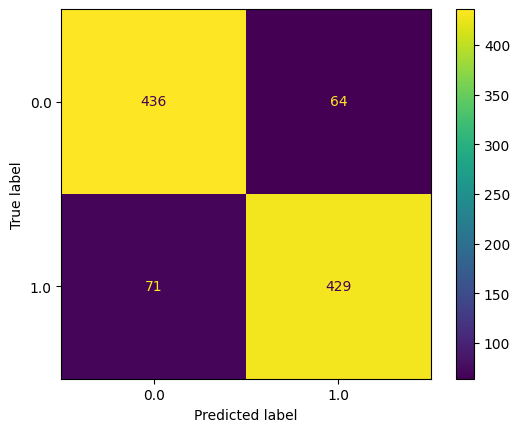

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_predict, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot()

We can also use spaCy with state-of-the-art models, such as [BERT](https://arxiv.org/abs/1810.04805) and [RoBERTa](https://arxiv.org/abs/1907.11692). Let's download the required packages:

Let's test the installed packages:

In [ ]:
!python -m spacy download en_core_web_trf # need to restart to use the model

2023-04-26 17:58:40.160237: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 460.3/460.3 MB 2.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_trf')


### 7.2 Transformers

In [ ]:
!pip install transformers

from transformers import RobertaTokenizer, RobertaModel
import torch

# Load the pre-trained RoBERTa tokenizer and model
tokenizer = RobertaTokenizer.from_pretrained('roberta-base')
model = RobertaModel.from_pretrained('roberta-base')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaModel: ['lm_head.layer_norm.bias', 'lm_head.layer_norm.weight', 'lm_head.bias', 'lm_head.dense.weight', 'lm_head.dense.bias', 'lm_head.decoder.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
# Define some text to get embeddings for
text = "Hello, how are you doing today?"
def get_embeddings(text, tokinizer, model):
  # Tokenize the text and prepare it to be input to the model
  tokens = tokenizer.encode(text, add_special_tokens=True)
  tokens_tensor = torch.tensor(tokens).unsqueeze(0)

  # Get the RoBERTa model's output for the text
  outputs = model(tokens_tensor)

  # Extract the last hidden state of the RoBERTa model output
  last_hidden_state = outputs.last_hidden_state

  # Get the vector embeddings for the tokens in the text
  return last_hidden_state.squeeze(0).detach().numpy()

get_embeddings(text, tokenizer, model)

array([[-0.06394986,  0.12484086, -0.01417445, ..., -0.06632672,
        -0.05382097, -0.02088588],
       [-0.21997294,  0.18713337, -0.03269188, ...,  0.11579579,
        -0.0124322 , -0.09865212],
       [-0.01420176,  0.20542066,  0.13036557, ..., -0.18024762,
        -0.05775505, -0.04409854],
       ...,
       [-0.05414977,  0.34702554,  0.17333758, ...,  0.20649417,
        -0.16249466,  0.12298045],
       [-0.03218207,  0.242072  ,  0.3701676 , ..., -0.85807955,
        -0.07759356,  0.10774104],
       [-0.0531468 ,  0.14668986, -0.03838569, ..., -0.11912781,
        -0.05497355, -0.0532699 ]], dtype=float32)

In [ ]:
vectors_list = []
texts = df["Review"].apply(lambda t: t[:514]).values
for text in tqdm(texts):
    vectors_list.append(get_embeddings(text, tokenizer, model))
vectors_list

100%|██████████| 3800/3800 [10:20<00:00,  6.12it/s]


[array([[-0.11776276,  0.11464245, -0.01319606, ..., -0.122994  ,
         -0.06650853, -0.0215528 ],
        [-0.11032666,  0.22137362,  0.06521861, ...,  0.136584  ,
          0.15010999, -0.02171971],
        [-0.03948017, -0.05550682,  0.02285708, ...,  0.04900315,
         -0.00436891,  0.21029508],
        ...,
        [-0.12967275,  0.04786262,  0.0894859 , ..., -0.12015393,
         -0.03541871,  0.10503734],
        [-0.11295328,  0.10964685, -0.03952758, ..., -0.16798645,
         -0.07931416, -0.04179251],
        [ 0.02234206,  0.07906567,  0.03295276, ...,  0.01143425,
         -0.00024611,  0.01343803]], dtype=float32),
 array([[-7.9622611e-02,  1.0062834e-01, -2.5760275e-04, ...,
         -5.9089832e-02, -2.3564339e-02, -3.2294106e-02],
        [ 2.5180036e-01, -3.9153263e-02, -5.4406978e-02, ...,
         -3.9264508e-02,  3.7059125e-02, -3.0768493e-02],
        [ 1.2837879e-01,  5.4897003e-02,  3.7604038e-02, ...,
         -3.1820187e-01,  2.0134673e-03,  2.2616199e-01]

In [ ]:
vectors_list2 = [v[0] for v in vectors_list]
cols = [f"Feature {i}" for i in range(len(vectors_list2[0]))]
v_df = pd.DataFrame(data = vectors_list2,columns=cols)
v_df = v_df.dropna()
v_df['sentiment'] = df['sentiment'].values
v_df.groupby('sentiment').size()

sentiment
0.0    1900
1.0    1900
dtype: int64

In [ ]:
v_df

,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,...,Feature 759,Feature 760,Feature 761,Feature 762,Feature 763,Feature 764,Feature 765,Feature 766,Feature 767,sentiment
0,-0.117763,0.114642,-0.013196,-0.051307,0.110265,-0.010381,0.012999,0.008977,0.037012,-0.096025,...,0.004796,-0.091086,-0.073938,0.003957,0.109306,0.069911,-0.122994,-0.066509,-0.021553,1.0
1,-0.079623,0.100628,-0.000258,-0.087810,0.063930,-0.036065,-0.026347,0.013621,0.059756,-0.073377,...,-0.001185,-0.067702,-0.059155,0.049564,0.141609,0.071138,-0.059090,-0.023564,-0.032294,1.0
2,-0.055190,0.130158,-0.028816,-0.070777,0.067931,-0.021351,-0.020901,0.000069,0.024917,-0.063759,...,0.009488,-0.094605,-0.076654,0.036639,0.097068,0.047149,-0.073606,-0.020982,-0.008907,1.0
3,-0.039288,0.065880,-0.022868,-0.100538,0.061803,-0.092034,-0.022856,0.014048,0.091569,-0.030807,...,-0.013896,-0.062354,-0.051999,0.045905,0.104574,0.054731,-0.049868,-0.062969,0.001871,1.0
4,-0.097765,0.093605,-0.021408,-0.108372,0.109206,-0.073699,-0.027502,0.011136,0.074508,-0.107158,...,0.020514,-0.094629,-0.075251,0.015738,0.101853,0.019472,-0.087180,-0.020576,-0.035229,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3795,-0.082824,0.086196,0.001227,-0.079585,0.087711,-0.029513,-0.013328,0.088600,0.053876,-0.101452,...,0.008319,-0.090477,-0.106405,-0.019611,0.102836,0.088030,-0.077250,-0.027507,0.005196,0.0
3796,-0.057985,0.052019,-0.013514,-0.077029,0.088036,-0.063855,-0.014672,0.035387,0.068388,-0.111222,...,-0.014578,-0.056992,-0.079014,0.016846,0.102251,0.129807,-0.096333,-0.039442,0.000393,0.0
3797,-0.116758,0.085803,-0.008323,-0.112234,0.120522,0.036576,-0.010515,0.047461,0.051912,-0.144609,...,-0.015732,-0.084027,-0.099350,0.005989,0.083357,0.096582,-0.159600,-0.059327,-0.042347,0.0
3798,-0.089731,0.118358,-0.037437,-0.115800,0.083855,-0.052309,-0.022133,0.053306,0.075798,-0.121165,...,-0.031670,-0.064168,-0.056789,0.040555,0.093476,0.074258,-0.082995,-0.056461,-0.072184,0.0


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score

pos_df = v_df[v_df["sentiment"] == 1]
neg_df = v_df[v_df["sentiment"] == 0]
train_df = pd.concat([neg_df.head(1400), pos_df.head(1400)])
test_df = pd.concat([neg_df.tail(500), pos_df.tail(500)])
train_df

X_train, X_test =  train_df, test_df
y_train, y_test =  train_df['sentiment'], test_df['sentiment']
X_train = X_train.drop("sentiment", axis=1)
X_test = X_test.drop("sentiment", axis=1)

clf = RandomForestClassifier(max_depth=4, random_state=0, n_estimators=100, n_jobs=-1 )
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)
print(accuracy_score(y_test,y_predict), roc_auc_score(y_test,y_predict))

0.947 0.947


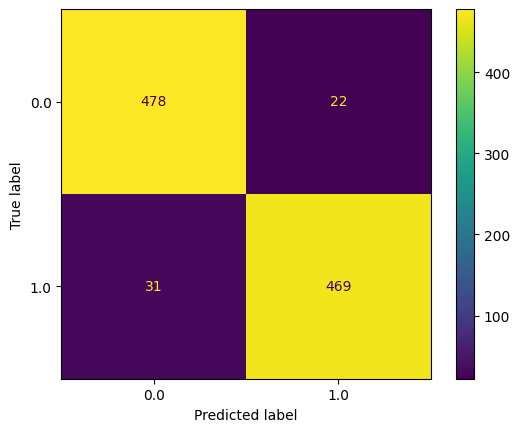

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_predict, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot()

## Further Readings
* [Topic Modeling with Gensim (Python)](https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/) by  Selva Prabhakaran
* [A Practitioner's Guide to Natural Language Processing (Part I) — Processing & Understanding Text](https://towardsdatascience.com/a-practitioners-guide-to-natural-language-processing-part-i-processing-understanding-text-9f4abfd13e72) by Dipanjan (DJ) Sarkar
* [Word Embeddings in Python with Spacy and Gensim](https://www.shanelynn.ie/word-embeddings-in-python-with-spacy-and-gensim/) by Shane Lynn
* [Word Embedding Using BERT In Python](https://towardsdatascience.com/word-embedding-using-bert-in-python-dd5a86c00342) by Anirudh S
* [BERT Word Embeddings Tutorial](https://mccormickml.com/2019/05/14/BERT-word-embeddings-tutorial/) by Chris McCormick and Nick Ryan